# Motivation
Our dataset is a collection of ufo sightings maintained by the __National UFO Reporting Center__ foundation since 1998, even though the first recorded data going back until 1906. In particular, for every sighting we have data about: the geographical localization, datetime, duration of the sighting, shape of the object and a brief comment of the situation [link](https://mavenanalytics.io/data-playground).
We chose this dataset because we find it curious and from some points of view fun to work with, recently (march 2025) in the european skys a [bright blue spiral appeared](https://www.bbc.com/news/articles/c241073v66jo) reopening the debate on the theme. Also we were intrested in working in less clean dataset, as an online form report is, to work more directly with people behaviour and perception of the phenomenon. We were also interested in learing more about natural language processing models, performing an analysis also in the open comment section of the dataset.

For this last objective, we definitely needed a **variant to the dataset 1**. Even though it had great and clear sanitization across the different *columns*, it fell short in the *comments* column due to a **very limited amount of characters**. 

We found [another extraction](https://huggingface.co/datasets/kcimc/NUFORC/tree/main) from the NUFORC website, which includes the full text of the *comments*. It's just one of the many scrapings out there. All of them are slightly differnt but based on the same source. On the other hand, this dataset contains a lot of incongruences and missing data, making a deep data analysis very hard.

For this reason, we decided to use the first dataset for exploring deeply data about locatin, dates, shapes and the other one for the comments analysis, since it has a more enrich version of them and the second one only for the sentiment analysis. In addition we used a US weather dataset, when we tryied to correlate sightings with weather conditions.
The final goal of this report is presenting the situation of ufo sightings to the reader, starting with a general descritpion of the dataset that we analyzied, then a focus part on a sentiment analysis of the reporters and in conclusion a comparison between debunkers and ufo believers.

# Basic statistics
As previously highlighted, since dataset are coming from an online form, with data inserted directly by users, we weren't surprised in finding some incongruences and some unsanitized data. As a first activity, we fixed some writing errors in the dataset, such as random characters in numeric fields (ex. a value of latitude _33q.200088_ or a value of duration _8'_). 

More specifically for the first dataset:
- The colums duration (seconds) and (hours/min) sometimes contain different values. We decided to analyze only data in seconds, since they are more standardized and comparable between themself, whereas hours/min are in some cases more vague (ex. 1/2 hours) and unstandardized (ex. _5 minutes_ vs _5 min. 7 sec_ vs _several minutes_ etc.).
- Some row contain a value of date posted anterior to the sighting datetime, we interpreted this as an error in the report instead of a prediction of the future, so in these rows we switch the two values.
Furthermore, we group the shape described by the reporters in a more precise set of cathegories, for a better classification.
Eventually, we found a lot of missing and inconsistent values in city, state and country fields, so we decided to ignore these values and to use only latitude and longitude for geolocalization.

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

tqdm.pandas()  # Registers the progress_apply method

COLOR = '#727272'
plt.rcParams['font.family'] = 'Helvetica Neue'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR
plt.rcParams['figure.dpi'] = 200

dataset = pd.read_csv('ufo_sightings_scrubbed.csv', dtype={
    'datetime': str,
    'city': str,
    'state': str,
    'country': str,
    'shape': str,
    'duration (seconds)': float,
    'duration (hours/min)': str,
    'comments': str,
    'date posted': str,
    'latitude': float,
    'longitude': float
})
dataset['datetime'] = pd.to_datetime(dataset['datetime'])
dataset['date posted'] = pd.to_datetime(dataset['date posted'])
# Drop unnecessary columns
dataset.drop(columns=['city', 'state', 'country', 'duration (hours/min)'], inplace=True)
# Rename colum duration (seconds) to duration
dataset.rename(columns={'duration (seconds)': 'duration'}, inplace=True)

# Swap datetime and date posted if datetime is greater than date posted
mask = dataset['datetime'].dt.date > dataset['date posted'].dt.date
dataset.loc[mask, ['datetime', 'date posted']] = dataset.loc[mask, ['date posted', 'datetime']].values

# Shape mapping
shape_mapping = {
    'cylinder': 'cylinder',
    'light': 'flash',
    'circle': 'disk',
    'sphere': 'sphere',
    'disk': 'disk',
    'fireball': 'fireball',
    'unknown': 'unknown',
    'oval': 'oval',
    'other': 'other',
    'cigar': 'cylinder',
    'rectangle': 'rectangle',
    'chevron': 'chevron',
    'triangle': 'triangle',
    'formation': 'formation',
    np.nan: 'unknown',
    'delta': 'triangle',
    'changing': 'changing',
    'egg': 'oval',
    'diamond': 'diamond',
    'flash': 'flash',
    'teardrop': 'teardrop',
    'cone': 'cone',
    'cross': 'cross',
    'pyramid': 'other',
    'round': 'disk',
    'crescent': 'changing',
    'flare': 'flash',
    'hexagon': 'other',
    'dome': 'other',
    'changed': 'changing'
}
dataset['shape'] = dataset['shape'].str.lower().map(shape_mapping)

# Remove incomplete year (2014)
dataset = dataset[dataset['datetime'].dt.year != 2014]


And then for the second dataset:


In [10]:
import re

df = pd.read_csv(
    "nuforc_bool.csv",
).rename(columns={
    'Sighting': 'Row ID',
    'Text': 'Comments',
    'Occurred': 'Datetime',
    'Duration': 'Duration (text)',
}).set_index('Row ID')

df.drop(columns=['Summary', 'Posted'], inplace=True)
df.rename(columns={ 'Reported': 'Date Posted' }, inplace=True)
df['Shape'] = df['Shape'].str.lower().map(shape_mapping)

# Convert headings to lowercase
df.columns = df.columns.str.lower()

# Fix dates
timezone_mapping = {
    "Pacific": "PST",    
    "Eastern": "EST",    
    "Central": "CST",    
    "Mountain": "MST",   
    "UTC": "UTC",
    "GMT": "GMT",
    "Local": "",  # Remove 'local' to keep datetime naive
}

def map_timezone(s):
    if pd.isna(s):
        return s
    # Extract last word
    last_word = re.findall(r'\b(\w+)$', s)
    if last_word and last_word[0] in timezone_mapping:
        # Replace last word with mapped timezone
        return re.sub(r'\b\w+$', timezone_mapping[last_word[0]], s)
    return s

df['datetime'] = pd.to_datetime(df['datetime'].apply(map_timezone), errors='coerce')
df = df[df['datetime'].dt.year >= 1906]
df['date posted'] = pd.to_datetime(df['date posted'].apply(map_timezone))

# Extract duration in seconds using regex
def extract_duration(duration):
    if not isinstance(duration, str):
        return np.nan
    # Match hours (e.g., "2 hours", "1hr")
    match_hr = re.search(r'(\d+)\s*hour', duration, re.IGNORECASE)
    if match_hr:
        return int(match_hr.group(1)) * 3600
    # Match minutes (e.g., "2 min", "20minutes")
    match_min = re.search(r'(\d+)\s*min', duration, re.IGNORECASE)
    if match_min:
        return int(match_min.group(1)) * 60
    # Match seconds (e.g., "30 seconds")
    match_sec = re.search(r'(\d+)\s*sec', duration, re.IGNORECASE)
    if match_sec:
        return int(match_sec.group(1))
    return np.nan

df['duration'] = df['duration (text)'].apply(extract_duration)

# Drop unnecessary columns and NAs
df.dropna(subset=['location', 'date posted', 'datetime'], inplace=True)

df_sent = df.dropna(subset=['comments']).copy()

/var/folders/kr/bqsygyl90h9gm8qzj278h8c80000gn/T/ipykernel_4477/721094646.py:42: FutureWarning: Parsed string "2014-10-23 11:11:17 PST" included an un-recognized timezone "PST". Dropping unrecognized timezones is deprecated; in a future version this will raise. Instead pass the string without the timezone, then use .tz_localize to convert to a recognized timezone.
  df['date posted'] = pd.to_datetime(df['date posted'].apply(map_timezone))


# Data analysis
## Part 1 - General Analysis

In this first part the focus will be in exploring first dataset contents, looking for temporal and geographical pattern, as well as a more advanced analysis about the correlation between shapes of UFOs and sighting's locations.

For the first plot we used the second dataset, since it has data updated until 2023, then for all other plots of this section we will use the first one, for the reasons explained in the previous section.

Temporal patterns: year distribution, month distribution, day of the week and time during the day

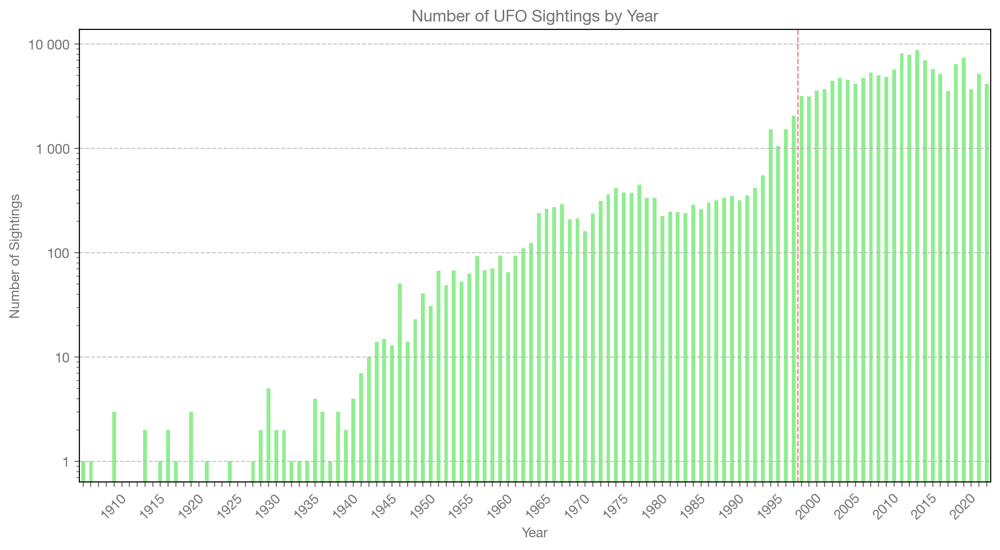

In [19]:
year_count = df['datetime'].dt.year.value_counts().sort_index()
all_years = pd.Series(0, index=np.arange(dataset['datetime'].dt.year.min(), dataset['datetime'].dt.year.max()))
year_count = all_years.add(year_count, fill_value=0)
year_count.plot(kind='bar', figsize=(12, 6), color='lightgreen', logy=True)
plt.title('Number of UFO Sightings by Year')
plt.xlabel('Year')
plt.ylabel('Number of Sightings')
plt.axvline(1998 - 1905.5, color='red', linestyle='--', linewidth=1, alpha=0.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

years = year_count.index
tick_locs = np.arange(len(years))
tick_labels = [str(year) if year % 5 == 0 else '' for year in years]

plt.xticks(tick_locs, tick_labels, rotation=45)
plt.yticks([1, 10, 100, 1000, 10000], ['1', '10', '100', '1 000', '10 000'])
plt.show()

In the plot above is represented the amount of sigthings per year, without surprise, the trend is in exponential increase (note the log-scale on the y-axis). However is important to highlight that, as shown with the vertical red bar and in the plot below, the webform collect data only from 1998: this means that probably the number of sigthings before that year is underestimated, and the data is made of personal archive of passionate sigthers. Also the low usage of internet in early 2000s can lead to an underestimation of the phenomenon.

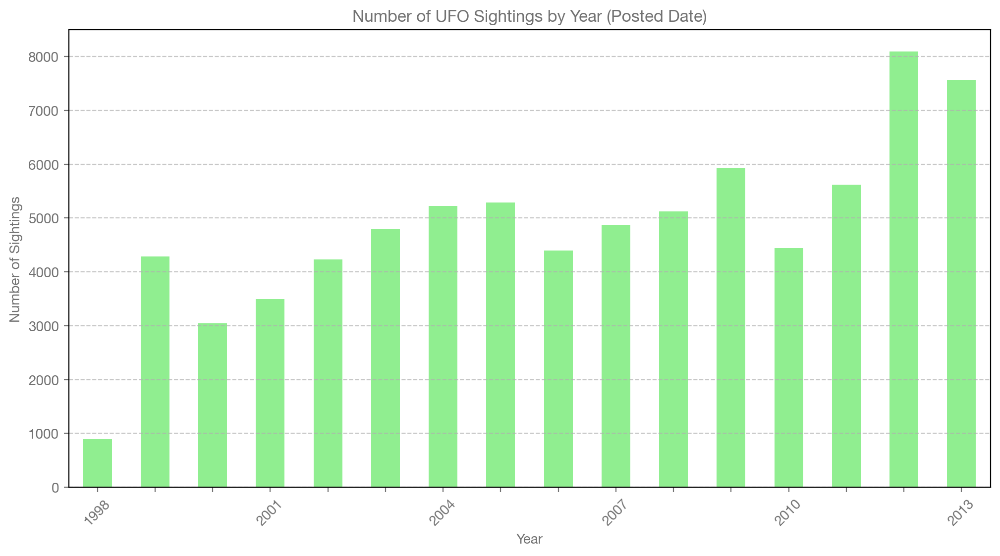

In [5]:
year_count = dataset['date posted'].dt.year.value_counts().sort_index()
all_years = pd.Series(0, index=np.arange(dataset['date posted'].dt.year.min(), dataset['date posted'].dt.year.max()))
year_count = all_years.add(year_count[:-1], fill_value=0)
year_count.plot(kind='bar', figsize=(12, 6), color='lightgreen')
plt.title('Number of UFO Sightings by Year (Posted Date)')
plt.xlabel('Year')
plt.ylabel('Number of Sightings')
plt.grid(axis='y', linestyle='--', alpha=0.7)

years = year_count.index
tick_locs = np.arange(len(years))
tick_labels = [str(year) if year % 3 == 0 else '' for year in years]

plt.xticks(tick_locs, tick_labels, rotation=45)
plt.show()

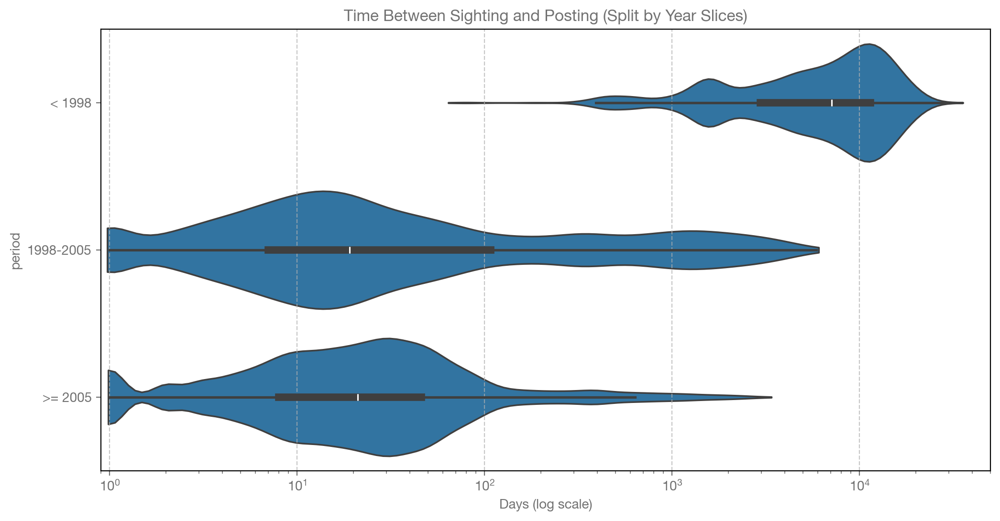

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define year column
dataset['year'] = dataset['datetime'].dt.year

# Define the slices
slices = [
    dataset[dataset['year'] < 1998],
    dataset[(dataset['year'] >= 1998) & (dataset['year'] < 2005)],
    dataset[dataset['year'] >= 2005]
]

# Calculate time differences in days
time_diff_days = [
    (slice_['date posted'] - slice_['datetime']).dt.days.clip(lower=1) for slice_ in slices
]

# Flatten and label for violinplot
import pandas as pd

violin_data = pd.DataFrame({
    'days': pd.concat(time_diff_days),
    'period': (
        ['< 1998'] * len(time_diff_days[0]) +
        ['1998-2005'] * len(time_diff_days[1]) +
        ['>= 2005'] * len(time_diff_days[2])
    )
})

# Plot the violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(
    data=violin_data,
    x='days',
    y='period',
    density_norm='width',
    inner='box',
    cut=0.1,
    log_scale=(True, False)
)
plt.title('Time Between Sighting and Posting (Split by Year Slices)')
plt.xlabel('Days (log scale)')
plt.xlim(0.9, 50000)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()


This plot compare the date of a sighting with the posting date of it in the website. Not surprisingly, values before 1998 (thus before the website opening) are quite high. More curiosly, even in recents years (such as after 2005) the average time between sighting and recording is higher than expected (a bit over 20 days, with the most occurrent value around 30 days). This means that the majority of data were inserted after several time, so a lack of precision and mistakes are evident.

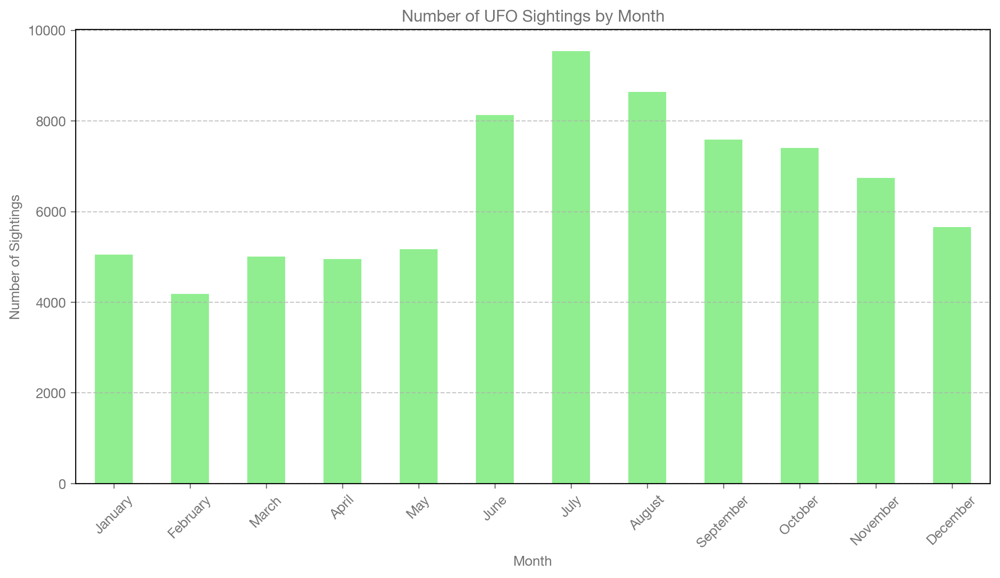

In [7]:
month_count = dataset['datetime'].dt.month.value_counts().sort_index()
month_count.plot(kind='bar', figsize=(12, 6), color='lightgreen')
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
plt.xticks(ticks=np.arange(12), labels=month_names, rotation=45)
plt.title('Number of UFO Sightings by Month')
plt.xlabel('Month')
plt.ylabel('Number of Sightings')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Looking into a monthly subdivision, the summer months (June, July and August) are clearly more popular for UFO sigthings and on the opposite side the lowest values are during winter months (Februray on top of all). _A possible explanation could be the higher amount of time spent outside_.
This pattern is not observable for southern hemisphere sigthings, due to the lower amount of data in comparison to the northern one.

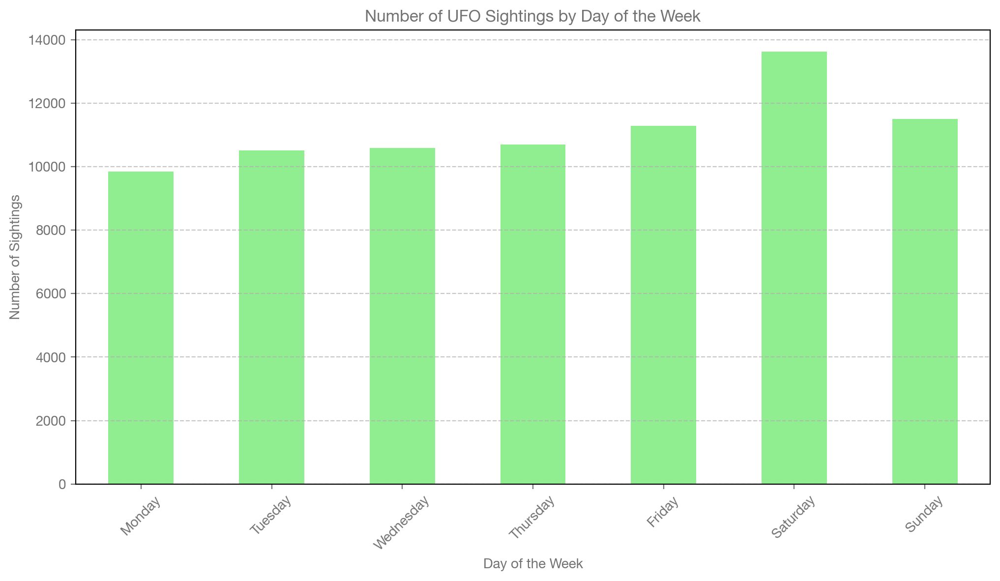

In [8]:
day_of_week_count = dataset['datetime'].dt.dayofweek.value_counts().sort_index()
day_of_week_count.plot(kind='bar', figsize=(12, 6), color='lightgreen')
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.xticks(ticks=np.arange(7), labels=day_names, rotation=45)
plt.title('Number of UFO Sightings by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Sightings')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Similarly, in day of week subdivision, there is a small increase of sighthings during weekend. _Again with high probability because people have more free time for looking at UFOs._

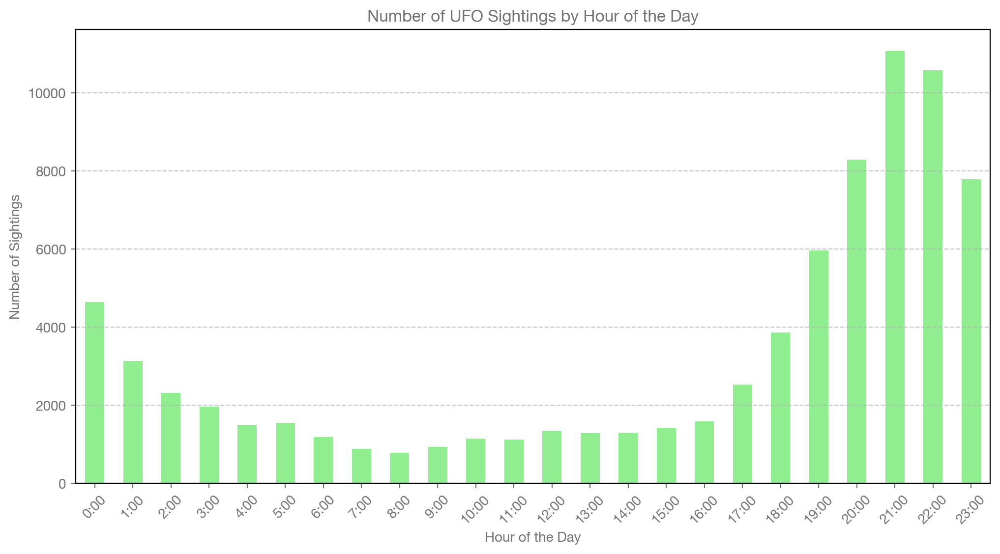

In [9]:
time_of_day_count = dataset['datetime'].dt.hour.value_counts().sort_index()
time_of_day_count.plot(kind='bar', figsize=(12, 6), color='lightgreen')
time_labels = [f'{hour}:00' for hour in range(24)]
plt.xticks(ticks=np.arange(24), labels=time_labels, rotation=45)
plt.title('Number of UFO Sightings by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Sightings')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In the plot above there is a clear unbalance in the hour of the day of UFO sigthings. Note that each sigthing is saved with the time-zone of its location, so a normalisation of the hours was not needed. The most frequent time is around 21 and 22, which seems a bit early for what we expected, also after 23 the number of sightings dramatically decrease, reaching the minimum at 8, actually when most of people already wake up.

shape categories

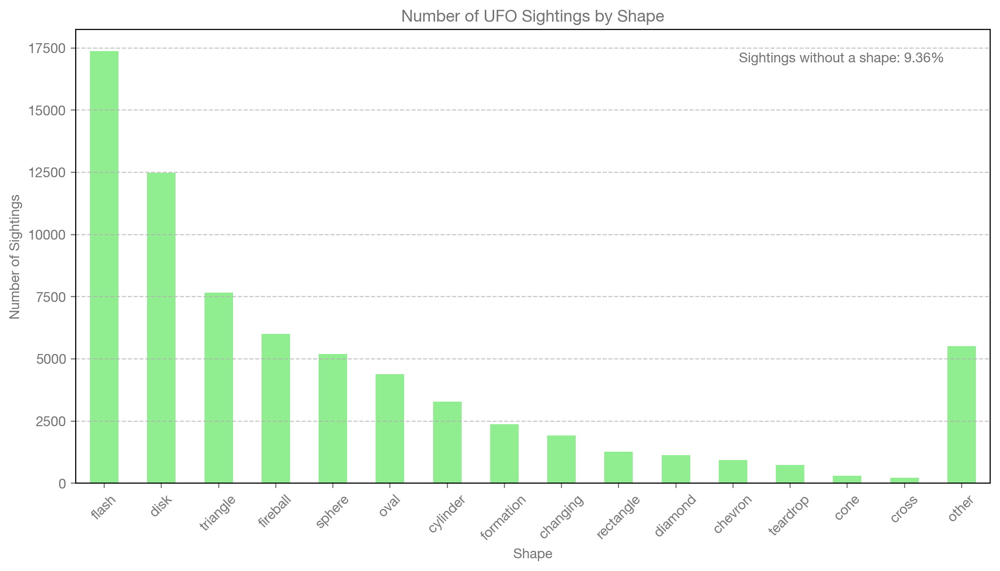

In [10]:
shape_counts = dataset['shape'].value_counts()
plt.text(0.95, 0.95, f'Sightings without a shape: {shape_counts["unknown"] * 100 / shape_counts.sum():.2f}%', 
         fontsize=10, va='top', ha='right', transform=plt.gca().transAxes)
shape_counts = shape_counts[shape_counts.index != 'unknown']  # Exclude 'unknown' category
# Move 'other' to the end
shape_counts = shape_counts.reindex(
    [shape for shape in shape_counts.index if shape != 'other'] + ['other']
)
shape_counts.plot(kind='bar', figsize=(12, 6), color='lightgreen')
plt.title('Number of UFO Sightings by Shape')
plt.xlabel('Shape')
plt.ylabel('Number of Sightings')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.show()

The data has a high amount of flash and disk sigthings. Then more detailed shapes were recorded. Around 10% of records were without a shape or the author was not able to describe a shape

sigthing durations

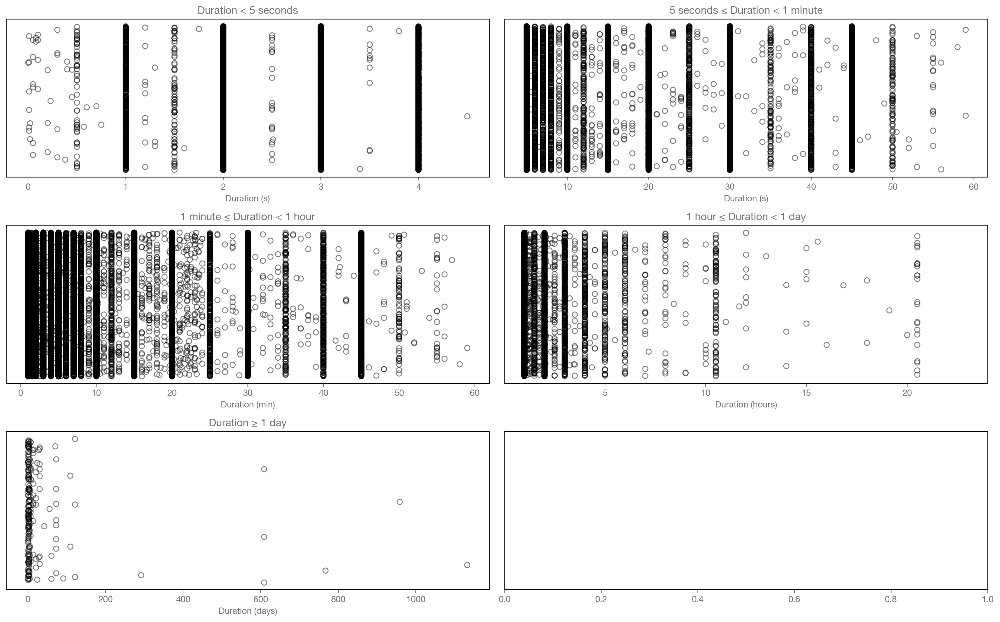

In [11]:
fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True)

# Filter data for each range
less_than_5s = dataset[dataset['duration'] < 5]
between_5s_1m = dataset[(dataset['duration'] >= 5) & (dataset['duration'] < 60)]
between_1m_1h = dataset[(dataset['duration'] >= 60) & (dataset['duration'] < 3600)]
between_1h_1d = dataset[(dataset['duration'] >= 3600) & (dataset['duration'] < 86400)]
greater_than_1d = dataset[dataset['duration'] >= 86400]

# Plot each range
axes[0, 0].scatter(less_than_5s['duration'], [np.random.random() for _ in range(len(less_than_5s))], 
                   alpha=0.5, facecolors='none', edgecolors='black')
axes[0, 0].set_title('Duration < 5 seconds')
axes[0, 0].set_xlabel('Duration (s)')
axes[0, 0].set_yticks([])

axes[0, 1].scatter(between_5s_1m['duration'], [np.random.random() for _ in range(len(between_5s_1m))], 
                   alpha=0.5, facecolors='none', edgecolors='black')
axes[0, 1].set_title('5 seconds ≤ Duration < 1 minute')
axes[0, 1].set_xlabel('Duration (s)')
axes[0, 1].set_yticks([])

axes[1, 0].scatter(between_1m_1h['duration'] / 60, [np.random.random() for _ in range(len(between_1m_1h))], 
                   alpha=0.5, facecolors='none', edgecolors='black')
axes[1, 0].set_title('1 minute ≤ Duration < 1 hour')
axes[1, 0].set_xlabel('Duration (min)')
axes[1, 0].set_yticks([])

axes[1, 1].scatter(between_1h_1d['duration'] / 3600, [np.random.random() for _ in range(len(between_1h_1d))], 
                   alpha=0.5, facecolors='none', edgecolors='black')
axes[1, 1].set_title('1 hour ≤ Duration < 1 day')
axes[1, 1].set_xlabel('Duration (hours)')
axes[1, 1].set_xlim(right=23.99)
axes[1, 1].set_yticks([])

axes[2, 0].scatter(greater_than_1d['duration'] / 86400, [np.random.random() for _ in range(len(greater_than_1d))], 
                   alpha=0.5, facecolors='none', edgecolors='black')
axes[2, 0].set_title('Duration ≥ 1 day')
axes[2, 0].set_xlabel('Duration (days)')
axes[2, 0].set_yticks([])

# Adjust layout
plt.tight_layout()
plt.show()

By looking at each sigthing duration, values are very different from themselfs, going from flash sigthing of 0.1 seconds, to prolonged sigthing of more than 3 years. Interestingly, the precision of the durations is not uniform in the different unit scales, as shown by the high number of "vertical black bar" in the left part of each period, tipical of data collected by humans and not from sensors or machines.

Correlation between different shapes, in annual sigthings

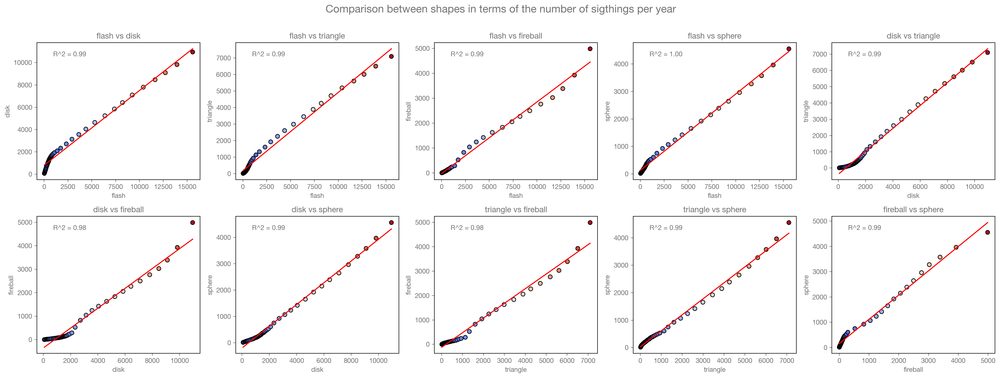

In [12]:
from itertools import combinations
from scipy.stats import linregress

focus_cat = ['flash', 'disk', 'triangle', 'fireball', 'sphere'] # categories with more than 5000 sightings
year_data = {}
rvalues = {}
small_dataset = dataset[dataset['datetime'].dt.year > 1965]
for shape in focus_cat:
    subset_data = small_dataset[small_dataset['shape'] == shape]
    year_data[shape] = subset_data['datetime'].dt.year.value_counts()
    year_data[shape] = year_data[shape].reindex(np.arange(subset_data['datetime'].dt.year.min(), subset_data['datetime'].dt.year.max()), fill_value=0)
    year_data[shape] = np.cumsum(year_data[shape])
fig, axs = plt.subplots(2, 5, figsize=(21, 8)) # A4 size
axs = axs.flatten()
for i, (shape1, shape2) in enumerate(combinations(focus_cat, 2)):
    slope, intercept, rvalue, _, _ = linregress(year_data[shape1], year_data[shape2])
    rvalues[(shape1, shape2)] = rvalue**2
    axs[i].plot(year_data[shape1], slope*year_data[shape1] + intercept, color='red')
    axs[i].scatter(year_data[shape1], year_data[shape2], c=year_data[shape1], cmap='coolwarm', edgecolor='k')
    axs[i].set_title(f"{shape1} vs {shape2}")
    axs[i].set_xlabel(shape1)
    axs[i].set_ylabel(shape2)
    axs[i].text(0.1, 0.9, f"R^2 = {rvalue**2:.2f}", transform=axs[i].transAxes)

plt.suptitle("Comparison between shapes in terms of the number of sigthings per year", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

The plot show potential correlation between different shape of UFOs during the years, starting from 1965. More in detail, each point represent the cumulative amount of sigthing for a shape in years. This comparison shows that more or less the proportion between shapes is constant during years. The only clear trend is that disk and triangle shapes were more popular in the past years, in respect to the other shapes.

Map of sigthings' location

In [22]:
from folium.plugins import HeatMap
from folium import Map
import matplotlib.pyplot as plt

map = Map(titles='Ufo Sightings', zoom_start=2, location=[10, 0])
heat_data = [[row['latitude'], row['longitude']] for _, row in dataset.iterrows()]
HeatMap(heat_data, radius=8, blur=4).add_to(map)
save_path = 'ufo_heatmap.html'
map.save(save_path)
map

In [ ]:
from folium.plugins import HeatMapWithTime

dataset = dataset[dataset['datetime'].dt.year >= 1960].copy() # From now on, we will only use data from 1960
map = Map(titles='Ufo Sightings', zoom_start=2, location=[10, 0])
years = list(range(1960, 2015, 5))
heat_data = [[[row['latitude'], row['longitude']] for _, row in dataset[(dataset['datetime'].dt.year >= i) & (dataset['datetime'].dt.year < i + 5)].iterrows()] for i in years]
HeatMapWithTime(heat_data, auto_play=True, index=years, speed_step=0.05, ).add_to(map)
map

The map shows that the data are highly biased from the country of origin, in particual with a high amount of data in english-speaking countries. In addition the sightings before the opening of the website are recorder almost only in the US and in the UK, confirming the bias. Curiosly, there aren't clusters in famous sigthing areas, such as Area 51 in Nevada, but they follow more or less the population distribution, with high clusters in big cities.

Correlation between geographical coordinates

0.10488973195350133


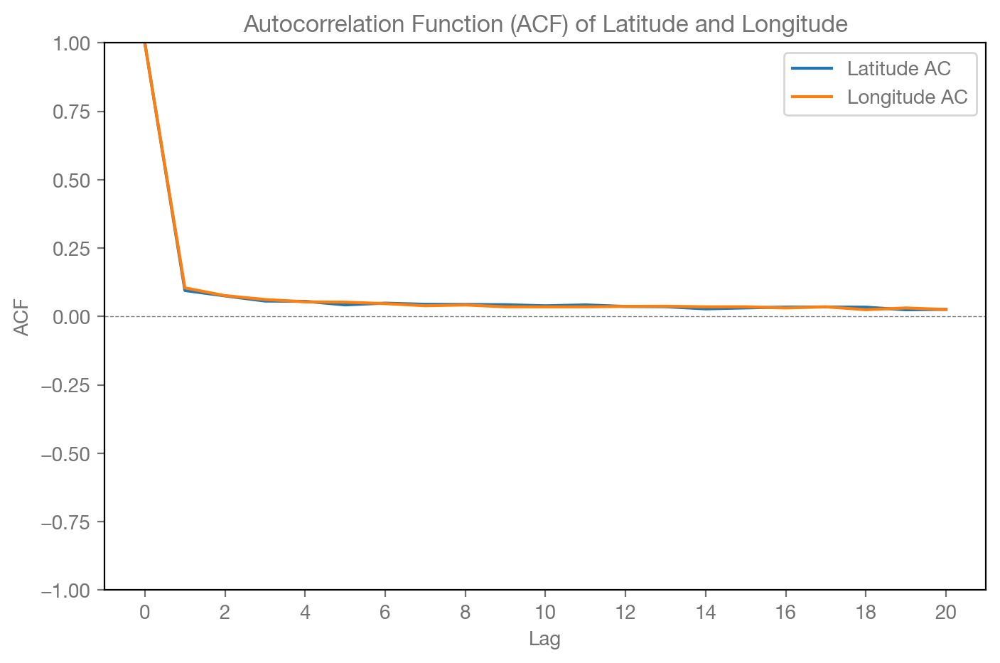

In [ ]:
from statsmodels.tsa.stattools import acf
# remove non US-Data
dataset = dataset[(dataset['latitude'] >= 25) & (dataset['latitude'] <= 50) &
                  (dataset['longitude'] >= -125) & (dataset['longitude'] <= -67)]
dataset.sort_values(by='datetime', inplace=True)
dataset['latitude'] = dataset['latitude'].apply(lambda x: round(x, 2))
dataset['longitude'] = dataset['longitude'].apply(lambda x: round(x, 2))
# check whith scipy.correlate2d
acf_lat = acf(dataset['latitude'], nlags=20)
acf_lon = acf(dataset['longitude'], nlags=20)
plt.figure(figsize=(8, 5))
plt.plot(acf_lat, label='Latitude AC')
plt.plot(acf_lon, label='Longitude AC')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.title('Autocorrelation Function (ACF) of Latitude and Longitude')
plt.xlabel('Lag')
plt.ylabel('ACF')
plt.ylim(-1, 1)
plt.xticks(ticks=np.arange(len(acf_lat), step=2), labels=np.arange(len(acf_lat), step=2))
print(max(acf_lat[1], acf_lon[1]))
plt.legend()
plt.show()

This plot shows the autocorrelation function between values of latitude and longitude. This function shows the level of autocorrelation (which is always between 1 and -1) between the location of a sigthing to the following one in cronological order (lag = 1), or after two (lag = 2) and so on. Excluding the trivial value of 1 for lag 0, there isn't a clear correlation for other values of lags, meaning that sigthing's location is mostly independent of the previous ones, even not considering the precise location but an area around it (roughly 1 square kilometer). 

## Part 2 - Emotional analysis

We're going to focus on a specific aspect of the UFO sighting: the **emotions** of those who claim to have experienced them. In other words, we decided to use the tools available to us through this course to extract and visualize *one of the biggest factors* that influence this phenomenon.

The reason? Deep down we know these sightings often feel arbitrary and depend heavily on what the individual says they saw. Most of the time, this is where methodology struggles the most — and it's **what fuels pseudo-scientific theories**.

In order to conduct [emotional analysis](https://en.wikipedia.org/wiki/Sentiment_analysis), a tool we will use is certainly [**NLP**](https://en.wikipedia.org/wiki/Natural_language_processing) (Natural Language Processing), which includes all sorts of techniques that, by leveraging AI, can estimate the *emotion* and/or the *sentiment* in a block of text. The difference between the two is that the first can include as many *feelings* as we want (happy, sad, *grief-stricken*, etc.), while the other typically corresponds to a *positive*, *negative*, or *neutral* mark.

### Dataset overview

In [16]:
print("Number of rows:", len(df))
print("Sighting date range:", df['datetime'].min(), "to", df['datetime'].max())
print("Posted date range:", df['date posted'].min(), "to", df['date posted'].max())
print("Sighting duration range:", df['duration'].min(), "to", df['duration'].max(), "seconds (around", int(df['duration'].max() / 86400), "days!!)")
print("Median length of comments:", int(df['comments'].str.len().median()), "characters (around", int(df['comments'].str.len().median() / 280), "tweets!!)")
print("Comment length range:", int(df['comments'].str.len().min()), "to", int(df['comments'].str.len().max()), "characters (around", int(df['comments'].str.len().max() / 280), "tweets!!)")

Number of rows: 147585
Sighting date range: 1721-02-01 05:24:00 to 2023-12-20 05:30:00
Posted date range: 1995-01-01 00:00:00 to 2023-12-20 09:05:20
Sighting duration range: 0.0 to 345600.0 seconds (around 4 days!!)
Median length of comments: 682 characters (around 2 tweets!!)
Comment length range: 1 to 64550 characters (around 230 tweets!!)


### Pre-processing
In order to try out different techniques for natural language processing, an important first step is to extract a **lemmatized** column in the second dataset. As beneficial as it is to have long comments, some models may still have a hard time figuring out the predominant emotion or sentiment if the text is too crowded.

[Lemmatization](https://en.wikipedia.org/wiki/Lemmatization) is the process of reducing words to their base or dictionary form. With **NLTK**, we can do this using the `WordNetLemmatizer`, which helps simplify the text and reduce noise by treating different forms of a word as a single term.

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Only first time
# nltk.download('all')

df_sent = df.dropna(subset=['comments']).copy()

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text, max_words=None):
    if not isinstance(text, str):
        return ""
    # Remove HTML-like codes using regex (e.g., &amp;, &#39;, etc.)
    # text = re.sub(r'&[#a-zA-Z0-9]+;', ' ', text)
    # Tokenize
    tokens = word_tokenize(text.lower())
    # Truncate if max_words is specified
    if max_words is not None:
        tokens = tokens[:max_words]
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in stop_words]
    # Lemmatize
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

df_sent['lemmatized comments'] = df_sent['comments'].progress_apply(lambda x: preprocess_text(x))

LookupError: 
**********************************************************************
  Resource [93mstopwords[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('stopwords')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mcorpora/stopwords[0m

  Searched in:
    - '/Users/ludocappe/nltk_data'
    - '/opt/anaconda3/nltk_data'
    - '/opt/anaconda3/share/nltk_data'
    - '/opt/anaconda3/lib/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/local/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/local/lib/nltk_data'
**********************************************************************


### NLP  
There are many methods to choose from and we tried all of them. They can be summarized in:

**BoW (bag of words)**  
This approach transforms text into a vector by counting how often each word appears, without considering grammar or word order. Each document gets a score based on the presence or frequency of specific words. It's simple but can miss context and meaning.

**Transformer-based models (e.g. BERT, ROBERTA)**  
These models understand context by processing the entire sentence at once, capturing meaning and nuance in a way traditional methods can't. They require more resources but can deliver better results.

**Cherry-picking terms**  
We manually pick and find specific keywords that are strongly associated with certain emotional tones or sentiments, and use their presence or frequency to get the classification.

#### Method 1: Sentiment Analysis with BoW Model (Vader)
This method is very resource-efficient, but its results aren't very useful, since 95% of the outputs are classified as neutral sentiment. Although this may actually reflect the nature of the data — most comments are simple descriptions of what was seen — the model is probably being misled by random punctuation or the excessive length of the texts.

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# initialize NLTK sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

def get_sentiment(text):
    scores = analyzer.polarity_scores(text)
    # Tresholding for sentiment
    sentiment = max(['pos', 'neu', 'neg'], key=lambda x: scores[x])
    return sentiment

df_sent['sentiment'] = df_sent['lemmatized comments'].progress_apply(get_sentiment)

df_sent['sentiment'].value_counts()

#### Method 2: Sentiment Analysis with Transformer model (BERT)
This method is particularly heavy on resources and not very promising in terms of results. 

The first issue comes from the complexity of the **transformer** architecture, which processes all words in parallel and requires a lot of memory and compute. For this reason, we only conducted a test on a tiny subset of the data to keep the processing time to some *minutes* instead of hours. 

The second issue is likely due to the limitation in tokens, which is set to 512. A possible solution we didn't dig into would have been to split each comment into multiple blocks and then average the results of the algorithm.

In [ ]:
from transformers import pipeline

sentiment_pipeline = pipeline(
    "sentiment-analysis",
    model="distilbert-base-uncased-finetuned-sst-2-english",
    top_k=1,
    truncation=True,
	max_length=512 # Truncate to 512 tokens for model limitations
)

# Sample 5000 rows for sentiment analysis because of resource limits
df_sent_sample = df_sent.sample(n=5000, random_state=42)
df_sent_sample['sentiment'] = df_sent_sample['comments'].progress_apply(
    lambda x: sentiment_pipeline(x)[0][0]['label']
)

df_sent_sample['sentiment'].value_counts()

Device set to use mps:0


  0%|          | 0/5000 [00:00<?, ?it/s]

sentiment
NEGATIVE    4438
POSITIVE     562
Name: count, dtype: int64

#### 🏆 Method 3: Emotional Analysis with Cherry-picking words  
This method is the **most lightweight** on resources and, at the same time, the one that led to the **most promising results** that could be extended to the whole dataset — with some important **limitations**.

The method we **handcrafted** 🍳 is based on a main keyword (e.g. *scared*), which is, for redundancy, aliased with a few others (e.g. *fear*, *worried*, ...). Then a **full-text search** is applied on the *lemmatized* comments, and a **flag** is assigned with the **main keyword** (i.e. the emotion) if *one or more* of the terms is found. As a result, a single comment can be associated with **multiple emotions**.

The limitations come mainly from the fact that the selected emotions and their correlated synonyms are, to some extent, **arbitrary**. We started with **Ekman's six basic emotions** (anger, disgust, fear, happiness, sadness, and surprise) and replaced *anger* and *disgust** with *confusion** and *curiosity*, as more relevant to our context. Also, the choice of synonyms can be considered arbitrary — we selected words that balanced the frequency in the dataset and the unlikeliness to be outliers from other parts of speech (e.g. using *glad* could unintentionally match contexts like *"I would be glad if"* rather than the gratitude emotion for the sighting).

Other limits may be due to people's spelling mistakes, or to the chosen **lemmatization** method, which might omit some relevant keywords or include irrelevant ones.

In [ ]:
# Define a list of emotion-related keywords with synonyms
emotion_keywords_synonyms = {
    'scared': ['scared', 'fear', 'afraid', 'panic', 'worried'],
    'confused': ['confused', 'uncertain', 'lost', 'unsure', 'disoriented'],
    'sad': ['sad', 'unhappy', 'upset', 'gloomy', 'depressed'],
    'surprised': ['surprised', 'shocked', 'stunned', 'speechless', 'taken-aback'],
    'joy': ['joy', 'excited', 'cheerful', 'enthusiastic', 'thrilled'],
    'curious': ['curious', 'interested', 'alert', 'intrigued', 'exploring'],
}
emotion_keywords = list(emotion_keywords_synonyms.keys())

# Create a column for each emotion keyword (lemmatized)
for emotion, synonyms in emotion_keywords_synonyms.items():
    df_sent[emotion] = df_sent['lemmatized comments'].progress_apply(
        lambda x: any(word in x.lower() for word in synonyms) if isinstance(x, str) else False
    )

# Display the updated dataframe with the new emotion columns
df_sent[['comments'] + emotion_keywords]

# Save the updated dataframe to a CSV file for later use
df_sent.to_csv("../../../_nuforc_sent.csv")

# Count the number of rows for each emotion
df_sent[emotion_keywords].sum().sort_values(ascending=False)

  0%|          | 0/130963 [00:00<?, ?it/s]

  0%|          | 0/130963 [00:00<?, ?it/s]

  0%|          | 0/130963 [00:00<?, ?it/s]

  0%|          | 0/130963 [00:00<?, ?it/s]

  0%|          | 0/130963 [00:00<?, ?it/s]

  0%|          | 0/130963 [00:00<?, ?it/s]

confused     7865
scared       6346
curious      4476
surprised    3445
joy          3245
sad           833
dtype: int64

#### Method 4: Emotional Analysis with Transformer model (RoBERTa)
Similarly as [before](#method-2-sentiment-analysis-with-transformer-model-bert), this method suffers from the same performance limitations due to the transformer architecture and the 512-token cap. 

However, *emotional* analysis with RoBERTa differs in that it returns a distribution over **multiple emotions rather than a single polarity**. This could, in theory, offer more nuanced insights compared to sentiment classification. 

Still, because of the longer and often noisy nature of our texts, this granularity ends up making the output less stable and very resource-heavy, especially when emotional signals are weak or mixed with descriptions.

In [ ]:
from transformers import pipeline

emotion_pipeline = pipeline(
    "text-classification",
    # model="cardiffnlp/twitter-roberta-base-emotion",
    model="j-hartmann/emotion-english-distilroberta-base", 
    top_k=1,
    truncation=True,
	max_length=512 # Truncate to 512 tokens for model limitations
)

# Sample 5000 rows for emotion analysis because of resource limits
# df_sent_sample = df_sent.sample(n=5000, random_state=42).copy()
df_sent_sample['emotion'] = df_sent_sample['comments'].progress_apply(
    lambda x: emotion_pipeline(x)[0][0]['label']
)

df_sent_sample['emotion'].value_counts()

Device set to use mps:0


  0%|          | 0/5000 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Visualizations (Method 3)  
Among the different methods, [the third one](#-method-3-emotional-analysis-with-cherry-picking-words) was favored because of the balance between computational efficiency and the representativeness of the dataset as a whole. It also featured a range of emotions that are interesting to explore and visualize.

#### Most frequent emotions
The plot to start with has to convey the most **intuitive yet basic** information possible. For this reason, we chose to plot with **bars** the overall instances of each emotion found in the dataset. 

It's important to note that a **color coding** was defined and consistently applied across the plots that will follow, making them easy to recognize at a glance which emotion each visual element refers to.

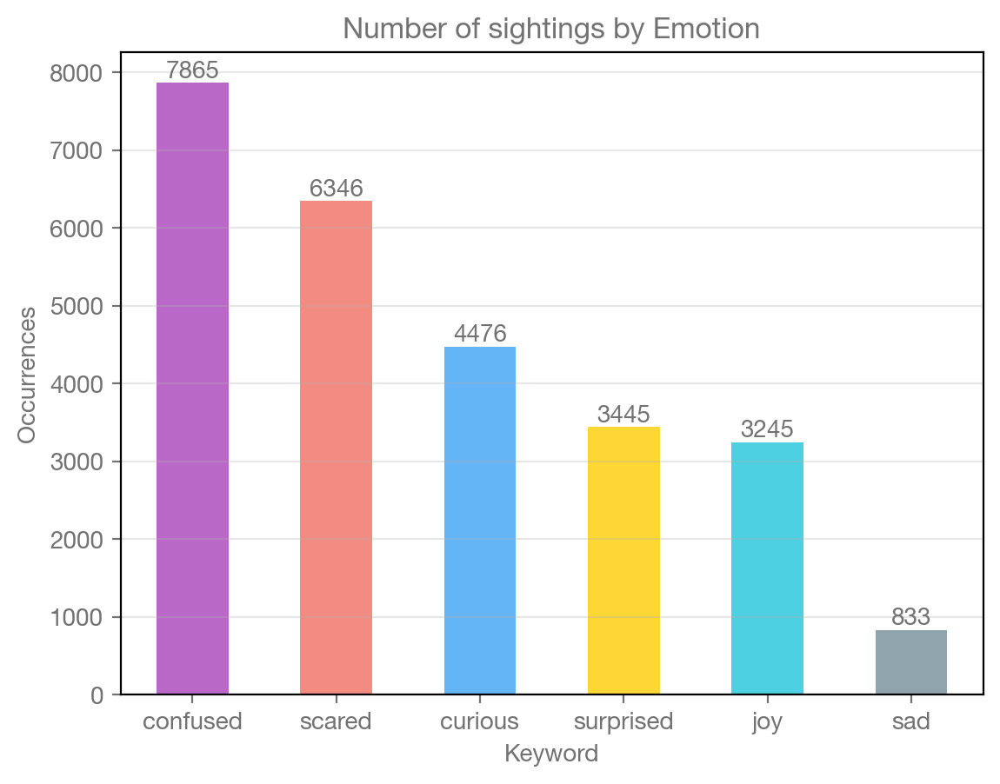

In [ ]:
# ------
# Setup 
# ------

output_path_plt = "../images/fp_"
output_path_bokeh = "../templates/fp_"

df_sent = pd.read_csv("../../../_nuforc_sent.csv")
df_sent['datetime'] = pd.to_datetime(df_sent['datetime'], errors='coerce')
df_sent['date posted'] = pd.to_datetime(df_sent['date posted'])

emotion_keywords_synonyms = {
    'scared': ['scared', 'fear', 'afraid', 'panic', 'worried'],
    'confused': ['confused', 'uncertain', 'lost', 'unsure', 'disoriented'],
    'sad': ['sad', 'unhappy', 'upset', 'gloomy', 'depressed'],
    'surprised': ['surprised', 'shocked', 'stunned', 'speechless', 'taken-aback'],
    'joy': ['joy', 'excited', 'cheerful', 'enthusiastic', 'thrilled'],
    'curious': ['curious', 'interested', 'alert', 'intrigued', 'exploring'],
}
emotion_keywords = list(emotion_keywords_synonyms.keys())

# Define a color for each emotion keyword
emotion_colors = {
    emotion_keywords[0]: '#f28b82',  # pastel red for fear/scared
    emotion_keywords[1]: '#ba68c8',  # pastel purple for confusion
    emotion_keywords[2]: '#90a4ae',  # pastel blue-grey for sadness
    emotion_keywords[3]: '#fdd835',  # pastel yellow for surprise
    emotion_keywords[4]: '#4dd0e1',  # pastel teal for joy
    emotion_keywords[5]: '#64b5f6',  # pastel blue for curiosity
}

# ------
# End setup
# ------

emotion_counts = df_sent[emotion_keywords].sum().sort_values(ascending=False)
ax = emotion_counts.plot(kind="bar", color=[emotion_colors.get(emotion) for emotion in emotion_counts.index])
plt.title("Number of sightings by Emotion")
plt.xlabel("Keyword")
plt.ylabel("Occurrences")
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=0)

# Annotate each bar with its value
for i, v in enumerate(emotion_counts):
    ax.text(i, v, str(v), ha='center', va='bottom', fontsize=10)

plt.savefig(output_path_plt + 'sightings_by_emotion.png', bbox_inches='tight')

The plot tells us that the most occurring emotion is "Confused" with almost 8000 reports in our dataset. Scared, Curious, and Surprised follow, with a somewhat equal separation between them, like a staircase. Joy is slightly less frequent than Surprised, both having around 3300 occurrences. Sad is by far the least occurring, having only 833 matches.

#### Emotion vs Time of the Day
Next up, we thought it would have been interesting to check whether the time of day had any influence on the emotions expressed in the reports. We therefore opted for a **subplot for each emotion**, featuring a **bar plot** covering the **0–24 hour range**.

Since the previous plot showed that the magnitude of occurrences varies significantly between emotions, we decided to make the plots share only the x-axis, not the y-axis. The goal was to highlight potential differences in the **shape** of the distributions, not in their absolute values.

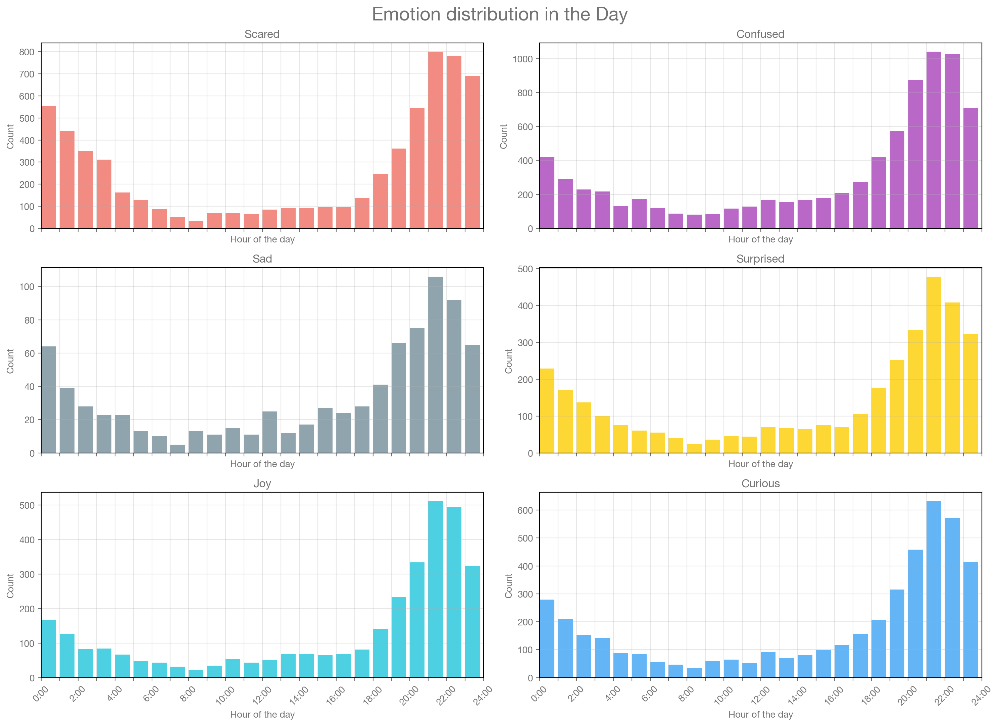

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 11), sharex=True)

for e, ax in zip(emotion_keywords, axes.flatten()):
    # Filter the DataFrame for the current emotion
    df_emotion = df_sent[df_sent[e] == True]
    
    # Count occurrences by hour
    df_emotion_count = df_emotion['datetime'].dt.hour.value_counts().sort_index().reset_index()
    df_emotion_count.columns = ['hour', 'count']
    
    ax.bar(
        df_emotion_count['hour'], 
        df_emotion_count['count'], 
        color=emotion_colors.get(e), 
        align="edge"
    )
    ax.set_xticks(range(0, 25))
    ax.set_xticklabels([f"{h}:00" if h % 2 == 0 else "" for h in range(0, 25)], rotation=45)
    ax.set_title(e.capitalize())
    ax.set_xlabel('Hour of the day')
    ax.set_xlim(0, 24)
    ax.set_ylabel('Count')
    ax.grid(alpha=0.3)

fig.suptitle('Emotion distribution in the Day', fontsize=20)
plt.tight_layout()
# plt.savefig(output_path_plt + 'emotion_distribution_in_the_day.png', bbox_inches='tight')
plt.show() # Doesn't seem relevant

There doesn't seem to be a noticeable difference between the shapes of the emotion distributions throughout the day. In other words, being late at night doesn't appear to make people more susceptible to expressing certain emotions when writing about the UFO they saw.

#### Emotion vs Years
Of course, we're interested in knowing if the **trend** of UFO sightings is going **up or down throughout the years**. Since this has already been covered in another section of our project, here we focused on whether a *specific emotion* is increasing or decreasing differently compared to the others. For this, we used a setup similar to before, with subplots — but this time using **histograms**, due to the large number of ticks and our goal to observe the general trend, not exact values.

It's important to note that, in this and the next plot, we decided to focus only on the period **1940–2023**. While the data extends further back, including everything wouldn't have added value and would clutter the visual in such a small space.

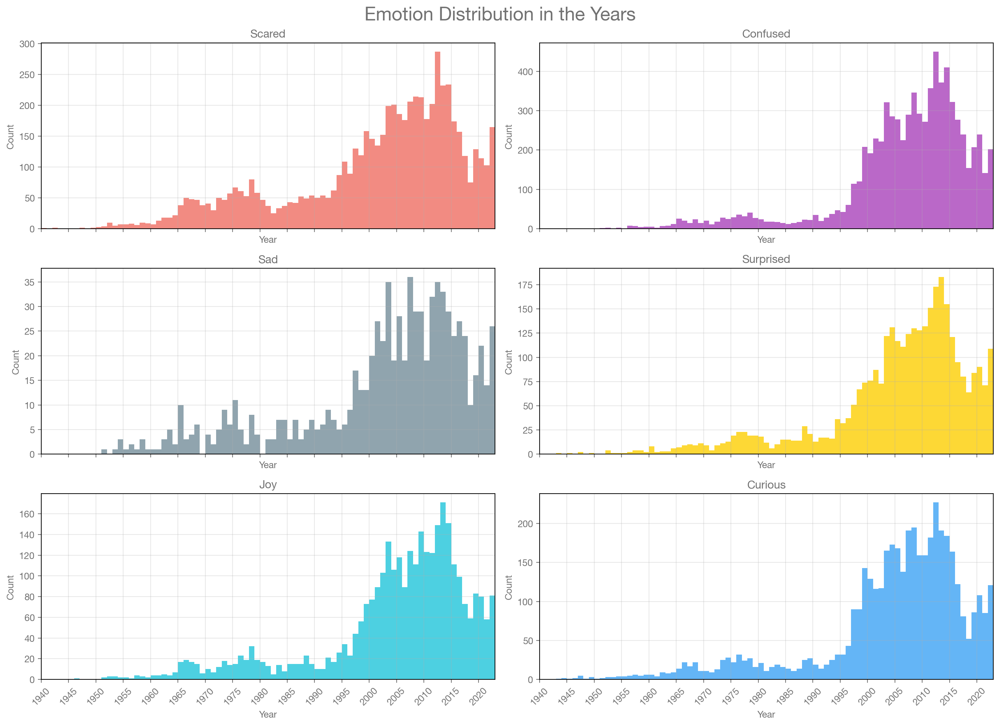

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 11), sharex=True)

# Define the year range
min_year = max(1940, int(df_sent['datetime'].dt.year.min()))
max_year = min(2025, int(df_sent['datetime'].dt.year.max()))
ticks = range(min_year, max_year + 1, 5)

for e, ax in zip(emotion_keywords, axes.flatten()):
    # Filter the DataFrame for the current emotion
    df_emotion = df_sent[df_sent[e] == True]

    counts, bin_edges = np.histogram(df_emotion['datetime'].dt.year.dropna(), bins=range(min_year, max_year + 2))
    ax.bar(
        bin_edges[:-1], 
        counts, 
        color=emotion_colors.get(e),
        width=np.diff(bin_edges),  # Calculate and use the width inline
        align='edge'
    )
    
    ax.set_title(e.capitalize())
    ax.set_xlabel('Year')
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, rotation=45)
    ax.set_xlim(min_year, max_year)
    ax.set_ylabel('Count')
    ax.grid(alpha=0.3)

fig.suptitle('Emotion Distribution in the Years', fontsize=20)
plt.tight_layout()
plt.savefig(output_path_plt + 'sightings_by_emotion_years.png', bbox_inches='tight')

All emotions show an increase after the year 2000, likely due to the rise of social media and the ease of reporting through the website, [launched in 1995](https://nuforc.org/about-us/). However, they all peaked in 2012 before experiencing a decline. The happening of this phenomena was covered by [news](https://www.huffpost.com/entry/american-ufo-reports-down_b_2982532) but its causes still remain unknown.

Scared is the most frequent emotion during the period from 1940 to 2000. And, strangely enough, 1980 and 1969 have been the only years in the trend not to have a single Sad UFO sighting.

Since in this case something seemed to be going on differently when breaking up data by emotion, we felt it was important to give readers a more **in-depth** look at the trends. This meant **overlapping** the data in a single plot, but given the number of emotions and the wide time span, we decided to make consultation easier through a [Bokeh](http://bokeh.org) time series. This offers users an **on-demand**, **interactive**, and more **personal** way to **explore** the data.

In [ ]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, RangeTool, Legend
from bokeh.layouts import column
from bokeh.io import output_notebook, output_file

output_notebook()

# Prepare data for each emotion
emotion_data = {}
for emotion in emotion_keywords:
    df_emotion = df_sent[df_sent[emotion] == True]
    df_emotion_count = df_emotion['datetime'].dt.year.value_counts().sort_index().reset_index()
    df_emotion_count.columns = ['year', 'count']
    emotion_data[emotion] = ColumnDataSource(df_emotion_count)

# Create the main Bokeh figure
p = figure(
    title="Occurrences of Emotions per Year",
    height=300, width=650,
    x_axis_label='Year', y_axis_label='Count',
    x_range=(2000, 2023)
)

p.xaxis.ticker = list(range(1940, 2025, 1))  # one tick per year
p.xaxis.major_label_orientation = 0.785  # 45 degrees in radians

p.add_layout(Legend(), 'right')

# Create the range selection tool
select = figure(
    title="Drag the middle and edges of the selection box to change the range above.\nAlso use the legend to show or hide lines.",
    height=130, width=650, y_range=p.y_range,
    x_range=(min_year, max_year),
    tools="", toolbar_location=None,
)

renderers_p = []
renderers_select = []

# Add a line for each emotion to both plots, and keep references to renderers
for emotion in emotion_keywords:
    source = emotion_data[emotion]
    r1 = p.line(
        x='year', y='count', source=source, line_width=2,
        color=emotion_colors.get(emotion, 'blue'), alpha=0.8,
        legend_label=emotion.capitalize()
    )
    r2 = select.line(
        x='year', y='count', source=source, line_width=1,
        color=emotion_colors.get(emotion, 'blue'), alpha=0.5,
    )
    renderers_p.append(r1)
    renderers_select.append(r2)

# Set up legend
p.legend.click_policy = "hide"
p.grid.grid_line_alpha = 0.5
select.grid.grid_line_alpha = 0.3

# Add RangeTool
range_tool = RangeTool(x_range=p.x_range)
range_tool.overlay.fill_color = "navy"
range_tool.overlay.fill_alpha = 0.2
select.add_tools(range_tool)

# Synchronize visibility between main plot and select plot
# This uses a CustomJS callback to link the visibility of lines
for r1, r2 in zip(renderers_p, renderers_select):
    r1.js_link('visible', r2, 'visible')

output_file(output_path_bokeh + "sightings_by_emotion_years.html")
show(column(p, select))

Loading BokehJS ...

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


As mentioned before, the first look at the chart highlights a **spike** in all emotions in **2012**, followed by a **drop afterward**. In general, we can say that starting from **1995**, the range of emotions began to **spread more widely**.

As expected, *Confused* is clearly the **most common emotion** across the board, especially in **2008** and again in **2012**. People mostly seem **disoriented** or **unsettled** by what they see. On the other hand, *Sad*, while being the **least occurring**, also appears to be the **most steady** throughout the entire timespan, without any particular spike.

Interestingly, *Surprised* overtakes *Curious* in **2018**, while *Curious* becomes more frequent again in **2020**. This fluctuation could indicate a **shift** in how people **perceive or describe** their experiences.

Another key observation is that *Scared* and *Curious* show the **most similar trend** between each other — even if neither overtakes the other. This could suggest that these emotions are more **situational** and tied to **specific events or phenomena**.

#### Prediction of Scared in the years  
Giving a break to the reader from comparing emotions, we deemed important to give a **positive** and **in-depth** look at the most occurring emotion, *Scared*. In particular, all of us might be interested in knowing whether the data may suggest a "**deadline**" for the negative effect of seeing a UFO. For the *visualization* part, we decided to use, as before, a line bar since it's useful to observe the **fluctuations**. On top of this, we also plotted another line featuring the *prediction* for the future years.

For the predictive part, we decided to simply apply a **polynomial regression**, using a degree that **visually best fit** the observed data, consequently giving a predicition afterwards. Polynomial regression is a method that models the relationship between the independent variable (in this case, the year) and the dependent variable (*Scared* count) as an **nth-degree polynomial curve**. A small cue for model quality is given by the **R² score** shown in the legend, which indicates how well the model explains the variance of the actual data — the closer it is to **1**, the better the fit.

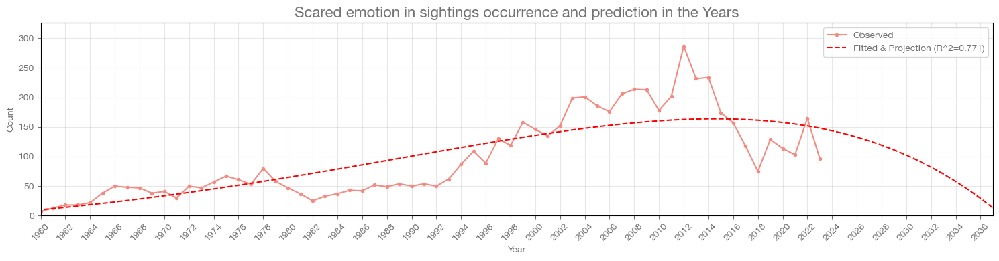

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Prepare data
df_emotion = df_sent[df_sent['scared'] == True]
df_emotion_count = df_emotion['datetime'].dt.year.value_counts().sort_index().reset_index()
df_emotion_count.columns = ['year', 'count']

max_year_pred = max_year + 15

# Fit a polynomial regression (degree=2 for a curve)
X = df_emotion_count['year'].values.reshape(-1, 1)
y = df_emotion_count['count'].values
poly = PolynomialFeatures(degree=45)
X_poly = poly.fit_transform(X)
model = LinearRegression().fit(X_poly, y)
r2 = model.score(X_poly, y)

# Predict for all years (observed + future)
all_years = np.arange(min_year, max_year_pred).reshape(-1, 1)
all_X_poly = poly.transform(all_years)
all_counts = model.predict(all_X_poly)

# Plot observed, fitted, and projection
plt.figure(figsize=(15, 4))
plt.plot(df_emotion_count['year'], df_emotion_count['count'], marker='o', markersize=3, label='Observed', color=emotion_colors.get('scared'))
plt.plot(all_years.flatten(), all_counts, 'r--', label=f'Fitted & Projection (R^2={r2:.3f})')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Scared emotion in sightings occurrence and prediction in the Years', fontsize=16)
plt.legend()
plt.grid(alpha=0.3)
plt.xticks(range(min_year, max_year_pred, 2), rotation=45)
plt.xlim(max(min_year, 1960), max_year_pred - 1)
plt.ylim(0, max(max(df_emotion_count['count']), int(all_counts.max()) * 2))
plt.tight_layout()
plt.savefig(output_path_plt + 'scared_years_projection.png', bbox_inches='tight')

Fitting a curve on the observed data, seems like that the frightening effect of sightings will be gone around 2040.

### Emotion vs Most occurring words  
Knowing that our method is based on the **exact words** in our text, we used the **word cloud** representation to give a general impression of the most frequent ones. A **word cloud** is a visual representation where the **size** of each word reflects its **frequency** in the text — the more a word appears, the larger it is in the cloud.

Of course, the initial idea was to compare the clouds at first sight, looking for differences **across the various emotions**. Although, with this level of detail, there **doesn't seem to be a noticeable difference** in the most occurring ones (words that change don't seem to be related to the emotion). Most of the time, they probably just focus on the **descriptive part** of the sighting and only **briefly** mention how they felt, without going into much depth or using other emotion-specific words.

It is important to note that, instead of the complete texts, we only focused on the *lemmatized* ones, in order to count the actual occurrences of a word regardless of its variation (e.g. *small* or *smaller*).

#### By emotion
Apparently no relevant differences

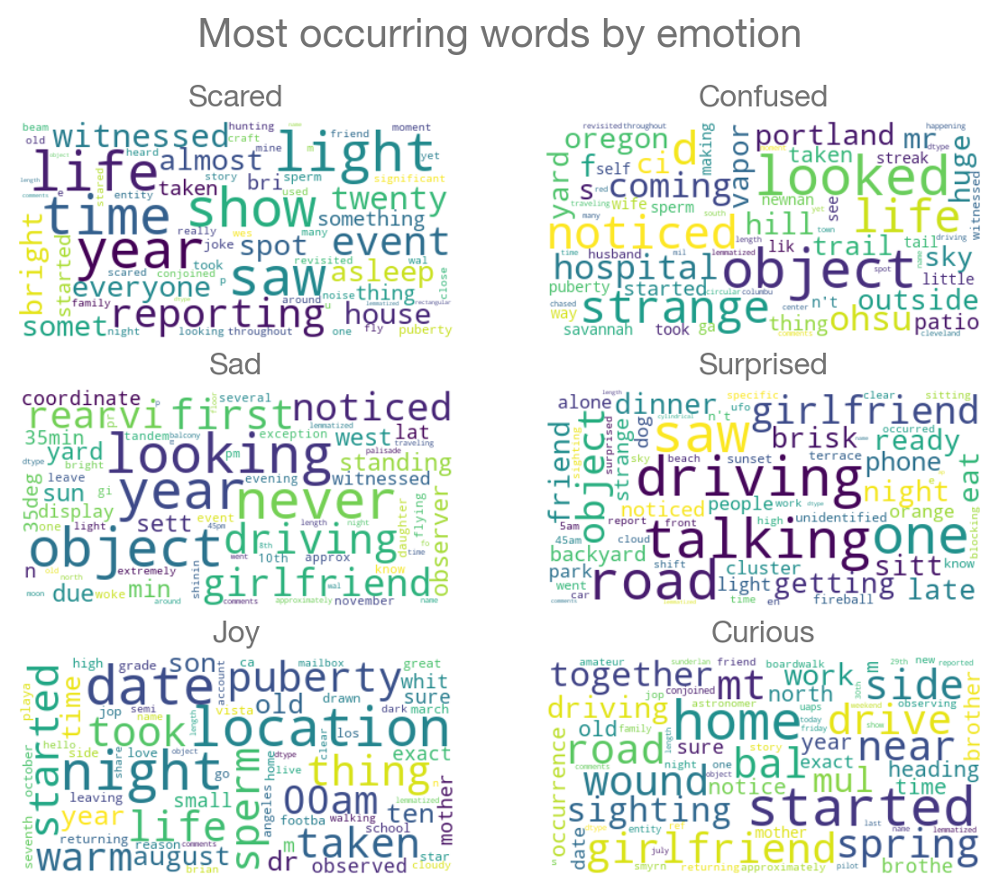

In [ ]:
from wordcloud import WordCloud
 
fig, axes = plt.subplots(3, 2, figsize=(6, 5))

for ax, e in zip(axes.flatten(), emotion_keywords):
    subset = df_sent[df_sent[e] == True]
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(str(subset['lemmatized comments']).lower())
    ax.set_title(e.capitalize())
    ax.imshow(wordcloud, interpolation="bilinear")
    ax.axis("off")

fig.suptitle('Most occurring words by emotion', fontsize=16)
plt.tight_layout()
plt.show()

#### Regardless of the emotion

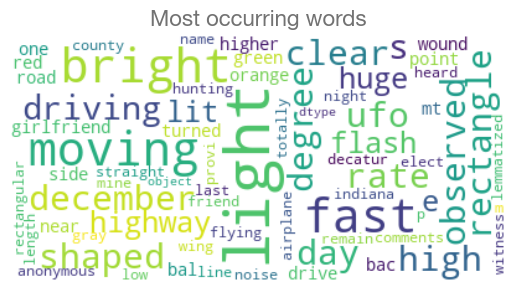

In [ ]:
from wordcloud import WordCloud
 
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(str(df_sent['lemmatized comments']).lower())
plt.title('Most occurring words', fontsize=16)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.savefig(output_path_plt + 'most_occurring_words.png', bbox_inches='tight')

As one might expect, some of the most occurring words are **light**, **fast**, **moving**, and **bright**, reflecting the fact that the comments are most of the time based on a thorough description of the phenomena itself.

Some smaller but still interesting words are **airplane**, maybe referring to what it seemed like; **drive**, possibly because that's the situation when one is continuously looking at the sky; and **girlfriend**, because apparently that's a very occurring witness.

### Emotion vs Shape
Similarly as before, we tried to investigate whether the **shape** might have had a different impact on the resulting emotion in the report. As before, we decided to split the plot between the different emotions and then used a **horizontal barplot** to try to compare them. 

The results show that there isn't a noticeable difference in the *shape* when trying to separate the sightings by the emotion. *Disk*, *flash* and *triangle* remain the three most popular ones in all of them.

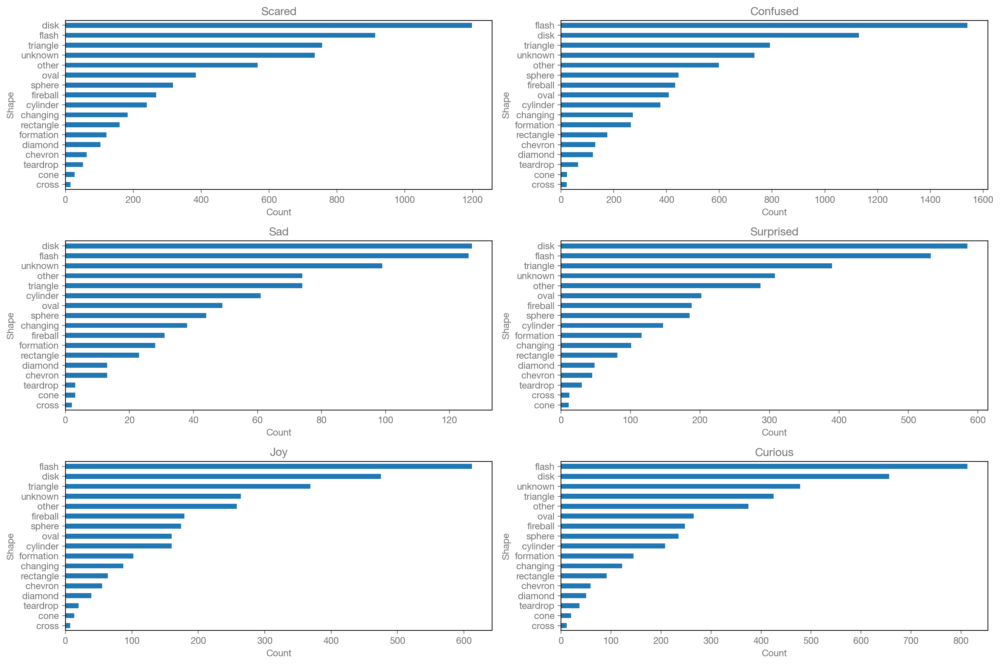

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 10))

for e, ax in zip(emotion_keywords, axes.flatten()):
    # Filter the DataFrame for the current emotion
    df_emotion = df_sent[df_sent[e] == True]
    df_emotion.groupby('shape')['shape'].count().sort_values(ascending=True).plot(kind='barh', ax=ax)
    ax.set_title(e.capitalize())
    ax.set_xlabel('Count')
    ax.set_ylabel('Shape')

# Hide unused subplots
for ax in axes.flatten()[len(emotion_keywords):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

### Emotion vs Duration  
The duration of the sighting is another aspect that might have been influenced by the emotion that the person had. Since this data is **numerical** and we were interested in comparing the *magnitude* of different indicators, we decided to use a **boxplot** for each emotion.

A boxplot is a statistical chart that displays the **distribution** of a dataset by showing its **median**, **quartiles**, and potential **outliers**. It helps quickly compare how spread out or skewed the durations are across different emotions.

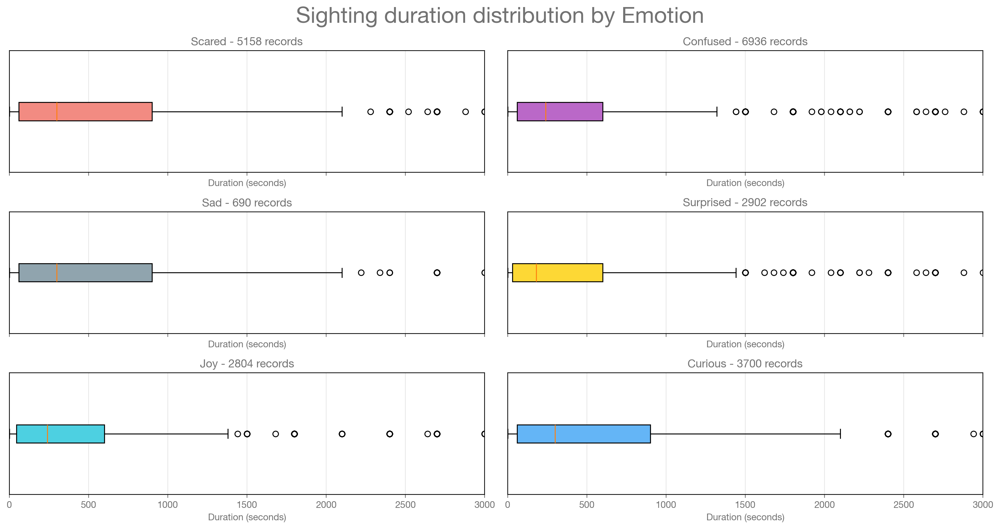

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 8), sharex=True)

for e, ax in zip(emotion_keywords, axes.flatten()):
    # Filter the DataFrame for the current emotion
    df_emotion = df_sent[df_sent[e] == True].copy().dropna(subset=['duration'])

    ax.boxplot(
        df_emotion['duration'], 
        vert=False, 
        patch_artist=True, 
        boxprops=dict(facecolor=emotion_colors.get(e))
    )
    ax.set_title(f'{e.capitalize()} - {len(df_emotion)} records')
    ax.set_xlabel('Duration (seconds)')
    ax.set_xlim(0, 3000)  # Set x-axis limit for better visibility
    ax.set_yticks([])  # Remove y-axis ticks for clarity
    ax.grid(axis='x', alpha=0.3)  # Add grid lines for x-axis

fig.suptitle('Sighting duration distribution by Emotion', fontsize=24)
plt.tight_layout()
plt.savefig(output_path_plt + 'sightings_by_emotion_duration.png', bbox_inches='tight')

The longest average durations come from Scared. You can see it clearly in the position of the box — the upper quartiles are visibly higher than most others. Confused and Joy are among the shortest, with the box packed tightly near the start of the x-axis. This might indicate that these emotions are less persisting than the negative ones.

All of them are still most of the time confined between a bunch of seconds and less than 15 minutes.

Whiskers also tell a story: Curious and some others have long whiskers, meaning their durations vary a lot. Confused and Joy seem to follow the same trend as before, having much shorter whiskers: those emotions show up in more uniform, shorter sightings.

Confused also stands out when it comes to the concentration of outliers in the analyzed range of duration. They show a bunch of scattered dots after the right whisker, even though their core durations are short — looks like rare, long events push those emotions over the edge.

### Cited movies  
A niche but very interesting aspect is whether people were influenced by **movies**. We all know that many popular movies about UFOs came out over the years, and we decided to see if any trend could be correlated to them.

At first, we just looked for the word "*movie*" in the dataset, getting some thousands of results. Then we looked through their texts and also online to create a set of **16 possible movies** that could have been referenced, together with their release year.

Then we created a data structure where, for each match of those movies, we noted down the **date** of the sighting, trying to see if there was a **correspondence**. Most of the time, the amount of matches couldn’t give a noticeable difference, so we decided to dig deep into one of the most popular among, **Star Wars** (also a favorite movie of ours). For this, we used a **barchart** with the references per year, in this case **highlighting** the bars corresponding to the **movie release**. A **note** has been added, since the reader could have been **confused** by the number of matches appearing already **before the movie release**.

In [ ]:
df_movies = df_sent.loc[
    df_sent['comments'].str.contains('movie', na=False),
    'comments'
]

print('There are ' + str(len(df_movies)) + ' records with the word "movie"')

# Mapping of movie names to publish years
movie_years = {
    "Twister": 1996,
    "Predator": 1987,
    "Armageddon": 1998,
    "Star Wars": 1977,
    "A scene out of a Spielberg movie": '?',
    "Old movie of the UFOs in Montana in the late forties": 1950,
    "Star Trek": 1979,
    "UFO Unplugged": 1997,
    "Deep impact": 1998,
    "Close Encounters of the Third Kind": 1977,
    "Independence Day": 1996,
    "E.T.": 1982,
    "The Day the Earth Stood Still": 1951,
    "War of the Worlds": 2005,
    "X-Files": 1998,
    "Interstellar": 2014,
}

# Prepare a list to collect results
movie_rows = []
for idx, row in tqdm(df_sent.iterrows(), total=len(df_sent)):
    comment = row['comments']
    year = row['datetime'].year if pd.notnull(row['datetime']) else None
    for movie, release_year in movie_years.items():
        if re.search(rf'\b{re.escape(movie)}\b', comment, re.IGNORECASE):
            label = f"{movie} ({release_year})"
            movie_rows.append({
                'Row ID': idx,
                'Movie': label,
                'Year': year,
                'Comment': comment
            })

# Create DataFrame
df_movies = pd.DataFrame(movie_rows)
df_movies.set_index('Row ID', inplace=True)
df_movies.sort_values(by='Movie', inplace=True)

print('There are ' + str(len(df_movies)) + ' records referencing movie titles')

df_movies

There are 1630 records with the word "movie"


  0%|          | 0/130963 [00:00<?, ?it/s]

There are 642 records referencing movie titles


,Movie,Year,Comment
Row ID,,,
51595,A scene out of a Spielberg movie (?),1978,My interest stems from my knowledge and experi...
36424,Armageddon (1998),2023,2 lights were noticed together like Mars & a s...
99118,Armageddon (1998),1964,This article will give you some information ab...
42523,Armageddon (1998),1999,"My parents, and my son and I were driving down..."
114808,Close Encounters of the Third Kind (1977),2018,I was watching the stars and noticed one of th...
...,...,...,...
72340,X-Files (1998),2022,I was awaken approximately at 1 AM by a sound ...
68740,X-Files (1998),2002,at about 9:45pm i saw a light out in the dista...
60445,X-Files (1998),2012,"It had a circular, aqua colored top that appea..."


In [ ]:
df_movies.groupby('Movie').size().sort_values(ascending=False).reset_index(name='Count')

,Movie,Count
0,Star Trek (1979),183
1,Star Wars (1977),163
2,Predator (1987),81
3,Independence Day (1996),67
4,Close Encounters of the Third Kind (1977),37
5,X-Files (1998),37
6,War of the Worlds (2005),24
7,Interstellar (2014),17
8,E.T. (1982),15
9,Twister (1996),6


### Year distribution of 'Star Wars' movie

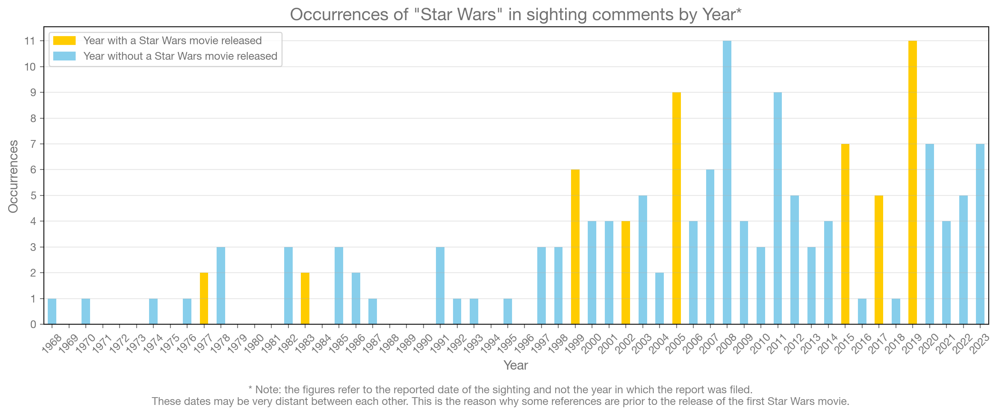

In [ ]:
import matplotlib.patches as mpatches

df_star_wars = df_sent.loc[df_movies[df_movies['Movie'] == 'Star Wars (1977)'].index].copy()
star_wars_ref_by_year = (
    df_star_wars['datetime'].dt.year.value_counts()
    .reindex(np.arange(df_star_wars['datetime'].dt.year.min(), df_star_wars['datetime'].dt.year.max() + 1), fill_value=0)
    .sort_index()
)

# Define the years of Star Wars movie releases
star_wars_years = [1977, 1980, 1983, 1999, 2002, 2005, 2015, 2017, 2019]

# Assign colors to bars based on whether the year corresponds to a Star Wars movie release
colors = ['#ffcc00' if year in star_wars_years else 'skyblue' for year in star_wars_ref_by_year.index]

# Create a bar plot
plt.figure(figsize=(13, 5))
star_wars_ref_by_year.plot(kind='bar', color=colors)

release_patch = mpatches.Patch(color='#ffcc00', label='Year with a Star Wars movie released')
other_patch = mpatches.Patch(color='skyblue', label='Year without a Star Wars movie released')
plt.legend(handles=[release_patch, other_patch])

# Add notice about the years
plt.figtext(
    0.5, -0.05, 
    '* Note: the figures refer to the reported date of the sighting and not the year in which the report was filed.\n'
    'These dates may be very distant between each other. This is the reason why some references are prior to the release of the first Star Wars movie.',
    ha='center', fontsize=10, color='gray', wrap=True
)

plt.title('Occurrences of "Star Wars" in sighting comments by Year*', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Occurrences', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.yticks(range(0, star_wars_ref_by_year.max() + 1))
plt.xticks(ticks=range(len(star_wars_ref_by_year.index)), labels=star_wars_ref_by_year.index, rotation=45)
plt.tight_layout()
plt.savefig(output_path_plt + 'sightings_by_star_wars_years.png', bbox_inches='tight')

From the plot, it is evident that, apart from the first two movies, sightings consistently peak around the release of new Star Wars movies. For instance, between 2014 and 2020, sightings rose and fell in sync with the release of three Star Wars films. While this could be coincidental, the references in the comments suggest that the movies may have influenced the reports.
It must be noted that the data shown reflects the stated date of the sighting, not the date in which it was posted. That's the reason why it is also referenced for sightings before the release of the first movie.

## Part 3 - What is really going on?

For this part we need another dataset, in addition to the already introduced UFO dataset, to see if there is a correlation between extreme weather and UFO sightings. 

### Introduction to the new STORM data set
To answer this question, we have chosen to use this data set: https://www.ncei.noaa.gov/pub/data/swdi/stormevents/csvfiles/ from NOAA. It has data from 1950 to 2024, and have categories such as Draught, Thunderstorm, etc as well as geo data. We decided to use data fra 1960 to 2013 (the UFO data I'm using only goes to 2013), after removing all the NaN in the important fields (geo, state, starting date), we have 751.321 rows. The preprocessing of the dataset can be seen below:

In [ ]:
# combine all the files into a single dataframe
# Create an empty list to hold each year's DataFrame
all_years = []

# Loop through the years and load each file
for year in range(1960, 2014):
    file_path = f"StormEvents_details-ftp_v1.0_d{year}_c20250401.csv.gz"
    try:
        s_df = pd.read_csv(file_path, compression='gzip', low_memory=False)
        all_years.append(s_df)

# Combine all dataframes into one
storms_df = pd.concat(all_years, ignore_index=True)

# lets clean it up a bit
# First, remove rows with missing values in relevant columns
storms_df.dropna(subset=['BEGIN_YEARMONTH', 'BEGIN_DAY', 'END_YEARMONTH', 'END_DAY'], inplace=True)

# Ensure columns are treated as strings and zero-padded if needed
storms_df['BEGIN_YEARMONTH'] = storms_df['BEGIN_YEARMONTH'].astype(float).astype(int).astype(str).str.zfill(6)
storms_df['BEGIN_DAY'] = storms_df['BEGIN_DAY'].astype(float).astype(int).astype(str).str.zfill(2)

storms_df['END_YEARMONTH'] = storms_df['END_YEARMONTH'].astype(float).astype(int).astype(str).str.zfill(6)
storms_df['END_DAY'] = storms_df['END_DAY'].astype(float).astype(int).astype(str).str.zfill(2)

# Create dates
storms_df['start_date'] = pd.to_datetime(
    storms_df['BEGIN_YEARMONTH'] + storms_df['BEGIN_DAY'], format='%Y%m%d', errors='coerce'
)
storms_df['end_date'] = pd.to_datetime(
    storms_df['END_YEARMONTH'] + storms_df['END_DAY'], format='%Y%m%d', errors='coerce'
)

# ONLY KEEP THE COLUMNS WE NEED
storms_df = storms_df[
    [   'STATE',
        'start_date',
        'end_date',
        'EVENT_TYPE',
        'BEGIN_LAT',
        'BEGIN_LON',
        'END_LAT',
        'END_LON'
    ]
]
# print(storms_df.head())
# now drop any rows with missing values in the columns we care about
storms_df.dropna(subset=['STATE', 'start_date', 'end_date', 'EVENT_TYPE', 'BEGIN_LAT', 'BEGIN_LON'], inplace=True)

# lets see if these events are in the same time and location as the UFO sightings
# removing Drought and Heat Wave, as they are not relevant to UFO sightings
storms_df = storms_df[~storms_df['EVENT_TYPE'].isin(['Drought', 'Heat'])]


Also adjusting the ufo df a little so it is easier to work with our new storm data. 

In [ ]:
# now that we have the weather data, we can see how it relates to the UFO data
df_part3 = df.copy()

# I need the state in the same format as the storms data (so CALIFORNIA instead of ca)
df_part3['state'] = df_part3['state'].str.upper()
state_mapping = {
    'AL': 'ALABAMA', 'AK': 'ALASKA', 'AZ': 'ARIZONA', 'AR': 'ARKANSAS', 'CA': 'CALIFORNIA',
    'CO': 'COLORADO', 'CT': 'CONNECTICUT', 'DE': 'DELAWARE', 'FL': 'FLORIDA', 'GA': 'GEORGIA',
    'HI': 'HAWAII', 'ID': 'IDAHO', 'IL': 'ILLINOIS', 'IN': 'INDIANA', 'IA': 'IOWA',
    'KS': 'KANSAS', 'KY': 'KENTUCKY', 'LA': 'LOUISIANA', 'ME': 'MAINE', 'MD': 'MARYLAND',
    'MA': 'MASSACHUSETTS', 'MI': 'MICHIGAN', 'MN': 'MINNESOTA', 'MS': 'MISSISSIPPI', 'MO': 'MISSOURI',
    'MT': 'MONTANA', 'NE': 'NEBRASKA', 'NV': 'NEVADA', 'NH': 'NEW HAMPSHIRE', 'NJ': 'NEW JERSEY',
    'NM': 'NEW MEXICO', 'NY': 'NEW YORK', 'NC': 'NORTH CAROLINA', 'ND': 'NORTH DAKOTA', 'OH': 'OHIO',
    'OK': 'OKLAHOMA', 'OR': 'OREGON', 'PA': 'PENNSYLVANIA', 'RI': 'RHODE ISLAND', 'SC': 'SOUTH CAROLINA',
    'SD': 'SOUTH DAKOTA', 'TN': 'TENNESSEE', 'TX': 'TEXAS', 'UT': 'UTAH', 'VT': 'VERMONT',
    'VA': 'VIRGINIA', 'WA': 'WASHINGTON', 'WV': 'WEST VIRGINIA', 'WI': 'WISCONSIN', 'WY': 'WYOMING',
    'AB': 'ALBERTA', 'ON': 'ONTARIO', 'NF': 'NEWFOUNDLAND AND LABRADOR',
    'BC': 'BRITISH COLUMBIA', 'MB': 'MANITOBA', 'NB': 'NEW BRUNSWICK',
    'PQ': 'QUEBEC', 'NS': 'NOVA SCOTIA', 'QC': 'QUEBEC', 'PE': 'PRINCE EDWARD ISLAND',
    'DC': 'DISTRICT OF COLUMBIA', 'NT': 'NORTHWEST TERRITORIES', 'SA': 'SOUTH AUSTRALIA',
    'YT': 'YUKON', 'YK': 'YUKON', 'SK': 'SASKATCHEWAN', 'PR': 'PRINCE EDWARD ISLAND'
}

# Replace state abbreviations with full state names
df_part3['state'] = df_part3['state'].map(state_mapping).fillna(df_part3['state'])

# Clean and preprocess the UFO dataset
df_part3['date'] = pd.to_datetime(df_part3['datetime'], errors='coerce')
df_part3['state'] = df_part3['state'].str.upper().str.strip()

# Clean and preprocess the storms dataset
storms_df['start_date'] = pd.to_datetime(storms_df['start_date'], errors='coerce')
storms_df['end_date'] = pd.to_datetime(storms_df['end_date'], errors='coerce')
storms_df['STATE'] = storms_df['STATE'].str.upper().str.strip()
storms_df['EVENT_TYPE'] = storms_df['EVENT_TYPE'].str.strip()

# remove state ontario from both datasets
# storms_df = storms_df[storms_df['STATE'] != 'ONTARIO']
# df_part3 = df_part3[df_part3['state'] != 'ONTARIO']

# Convert dates to just the date component (without time)
df_part3['date_only'] = df_part3['date'].dt.date
storms_df['date_only_start'] = storms_df['start_date'].dt.date
storms_df['date_only_end'] = storms_df['end_date'].dt.date

To explore whether extreme weather events might influence the number of reported UFO sightings, we narrowed our focus to the top 10 most frequent weather types in the U.S. storm event dataset, excluding 'Heat' and 'Drought' due to their long duration and low relevance to sudden visual anomalies.

Let’s start by looking at the subplot below, which visualizes UFO sightings in the 16 U.S. states with the highest number of reports. The bars show the total number of sightings during extreme weather events, with red indicating sightings that occurred without any such events. As seen, there is considerable variation between states. The most common weather types associated with sightings are hail, thunderstorms, and high wind, conditions that could easily disturb or obscure visual overview. For instance, strong winds may lift debris or objects into the sky, while heavy snow, fog, or rain can reduce visibility, increasing the chance of misinterpretation.

Interestingly, some states show a relatively higher proportion of sightings during extreme weather; Colorado, Texas, Illinois, and Missouri, while others, like Oregon, Washington, Arizona, and New Jersey, have most sightings reported in calm weather.

This contrast could partly be explained by regional weather patterns. States like Colorado, Texas, and Missouri are known for dramatic and fast-changing weather, including thunderstorms, tornadoes, and strong winds. These weather patterns may increase the chance of misinterpreting natural events as UFOs. Illinois, also sees varied weather and has large urban areas with lots of air traffic, which could add to visual confusion.

On the other hand, Oregon and Washington (Pacific Northwest) are known for frequent cloud cover and rain, but not necessarily for dramatic weather events, but both states have a long history of UFO interest. Washington, for instance, was the site of one of the first major modern UFO sightings in 1947 (the "Kenneth Arnold sighting"). Arizona is famously home to the 1997 “Phoenix Lights” incident, one of the most widely reported UFO sightings in U.S. history. New Jersey, while more urban, is close to New York and has a high population density, which may lead to more overall reports simply due to the number of people.

Taken together, these patterns suggest that both environmental and cultural factors influence UFO sighting trends. States with more extreme weather may generate more UFO reports during storms due to natural misinterpretations, while states with strong UFO-related histories or high public interest might see more reports in general, regardless of the weather.

### Why did we choose the subplot?
Focusing on the top 16 states with the highest number of UFO sightings is a good strategy because it allows us to analyze regions with significant data, ensuring more reliable insights into trends. By examining these states, we can better understand how weather events impact UFO reports in areas where sightings are more frequent.

It’s also important to consider reports that occur during calm weather (with no special weather events) to identify potential baseline patterns. This helps differentiate between sightings influenced by extreme weather and those that are independent of weather conditions, offering a clearer understanding of how natural factors might affect UFO misinterpretations.



In [ ]:
# Custom order for consistent subplot layout
custom_order = [
    'CALIFORNIA', 'TEXAS', 'WASHINGTON', 'ILLINOIS',
    'NEW YORK', 'PENNSYLVANIA', 'OHIO', 'NORTH CAROLINA',
    'FLORIDA', 'ARIZONA', 'MICHIGAN', 'INDIANA',
    'MISSOURI', 'NEW JERSEY', 'COLORADO', 'OREGON' 
]

# Create a figure with a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(20, 20))
axes = axes.flatten()

# Define y-axis limits based on subplot index
y_limits = {
    0: 9700,  # CALIFORNIA
    1: 9700,  # TEXAS
    2: 4200,  # WASHINGTON
    3: 4200,  # ILLINOIS
    4: 3200, 5: 3200, 6: 3200, 7: 3200,         # Row 2
    8: 3000, 9: 3000, 10: 3000, 11: 3000,       # Row 3
    12: 2100, 13: 2100, 14: 2100, 15: 2100      # Row 4
}
# Loop over states in the specified custom order
for i, state in enumerate(custom_order):
    # Filter UFO sightings for this state
    state_ufo = df_part3[df_part3['state'] == state]

    # Filter storms for this state
    state_storms = storms_df[storms_df['STATE'] == state]

    # Count UFO sightings by date
    ufo_dates = state_ufo['date_only'].value_counts().to_dict()

    # Initialize counts
    weather_counts = {}
    matched_dates = set()

    for ufo_date, count in ufo_dates.items():
        matched = False

        # Check if UFO date is within any storm event's date range
        matching_storms = state_storms[
            (state_storms['date_only_start'] <= ufo_date) &
            (state_storms['date_only_end'] >= ufo_date)
        ]

        if not matching_storms.empty:
            matched = True
            for _, storm in matching_storms.iterrows():
                event_type = storm['EVENT_TYPE']
                weather_counts[event_type] = weather_counts.get(event_type, 0) + count
            matched_dates.add(ufo_date)

        if not matched:
            matched_dates.add((ufo_date, 'no_weather'))

    # Calculate how many sightings happened on days without weather events
    total_ufo_sightings = sum(ufo_dates.values())
    matched_sightings = sum([ufo_dates[date] for date in matched_dates if not isinstance(date, tuple)])
    no_weather_sightings = total_ufo_sightings - matched_sightings

    # Get the top 10 weather types
    top_weather = sorted(weather_counts.items(), key=lambda x: x[1], reverse=True)[:10]

    if top_weather or no_weather_sightings > 0:
        weather_types = [w[0] for w in top_weather]
        counts = [w[1] for w in top_weather]

        # Add the "No Weather" bar
        weather_types.append("No Weather")
        counts.append(no_weather_sightings)

        # Create bar plot
        ax = axes[i]
        bar_colors = ['skyblue'] * (len(weather_types) - 1) + ['lightcoral']
        bars = ax.bar(range(len(weather_types)), counts, color=bar_colors)

        ax.set_title(f"{state}: {total_ufo_sightings} UFO Sightings", fontsize=12)
        ax.set_xticks(range(len(weather_types)))

        # Rotate x-axis labels
        weather_labels = [w[:12] + '...' if len(w) > 12 else w for w in weather_types]
        ax.set_xticklabels(weather_labels, rotation=45, ha='right', fontsize=8)

        ax.set_ylabel('UFO Sighting Count', fontsize=10)

        # Label counts on bars
        for bar, count in zip(bars, counts):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    str(count), ha='center', va='bottom', fontsize=8)
    else:
        # Show message if no data
        ax = axes[i]
        ax.text(0.5, 0.5, f"No data for UFO sightings\nin {state}",
                ha='center', va='center', fontsize=12)
        ax.set_xticks([])
        ax.set_yticks([])

    # Set y-axis limits per the custom dictionary
    ax.set_ylim(0, y_limits.get(i, 2000))

# Adjust layout and add main title
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)
fig.suptitle('UFO sightings by weather event for the top 16 UFO states', fontsize=20, y=1.02)

# Show the plot
plt.show()

# # Adjust layout and add main title
# plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Adjust bottom margin
plt.subplots_adjust(hspace=0.4)

### Why did we also include a single bar plot?
Creating a combined bar plot for all states is important because it provides an overall view of the data, highlighting broader trends across the entire dataset. By visualizing all states together, we can observe that 66% of UFO reports occur during normal weather, but we also see a significant number of sightings during thunderstorms. This suggests a possible correlation between extreme weather events, like thunderstorms, and UFO reports. The plot allows us to see patterns that might be less apparent when focusing on individual states, offering a more comprehensive understanding of how weather may influence the frequency of UFO sightings.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from collections import defaultdict

# Get all unique states in the UFO dataset
all_states = df_part3['state'].unique()

# Initialize master counters
master_weather_counts = defaultdict(int)
total_no_weather = 0
total_sightings = 0

# Process each state separately to match your subplot code's logic
print(f"Processing {len(all_states)} states...")

# Process each state
for state in all_states:
    # Filter UFO sightings for this state
    state_ufo = df_part3[df_part3['state'] == state]
    
    # Filter storms for this state
    state_storms = storms_df[storms_df['STATE'] == state]
    
    # Count UFO sightings by date
    ufo_dates = state_ufo['date_only'].value_counts().to_dict()
    
    # Track which dates had weather events
    dates_with_weather = set()
    
    # Count sightings by weather event type
    for ufo_date, count in ufo_dates.items():
        # Check if UFO date is within any storm event's date range
        matching_storms = state_storms[
            (state_storms['date_only_start'] <= ufo_date) &
            (state_storms['date_only_end'] >= ufo_date)
        ]
        
        if not matching_storms.empty:
            # This date had weather events
            dates_with_weather.add(ufo_date)
            
            # Count for each weather type
            for _, storm in matching_storms.iterrows():
                event_type = storm['EVENT_TYPE']
                master_weather_counts[event_type] += count
    
    # Calculate sightings without weather events
    state_total_sightings = state_ufo.shape[0]
    
    # Count sightings on dates without weather
    no_weather_sightings = 0
    for ufo_date, count in ufo_dates.items():
        if ufo_date not in dates_with_weather:
            no_weather_sightings += count
    
    # Add to master totals
    total_no_weather += no_weather_sightings
    total_sightings += state_total_sightings

# Prepare data for plotting
print("\nPreparing plot data...")
weather_data = [(event, count) for event, count in master_weather_counts.items() if count > 5]
weather_data.sort(key=lambda x: x[1], reverse=True)

# Get top weather events (keeping more to account for all states)
weather_data = weather_data[:19]  # Take top 19 to leave room for "No Weather"

# Add "No Weather" to the end
weather_data.append(("No Weather", total_no_weather))

# Extract for plotting
event_types = [item[0] for item in weather_data]
counts = [item[1] for item in weather_data]

# Create the visualization
plt.figure(figsize=(16, 10))

# Plot bars with consistent color scheme
bar_colors = ['lightsteelblue'] * (len(event_types) - 1) + ['red']
bars = plt.bar(range(len(event_types)), counts, color=bar_colors)

# Add labels on top of bars
for i, count in enumerate(counts):
    plt.text(i, count + 5, f'{count}', 
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# Set up axes and labels
plt.xlabel('Weather Event Type', fontsize=14)
plt.ylabel('Number of UFO Sightings', fontsize=14)
plt.title('UFO Sightings by Weather Type Across All US States', fontsize=18)

# Format x-axis labels
plt.xticks(range(len(event_types)), 
           [evt[:15] + '...' if len(evt) > 15 else evt for evt in event_types], 
           rotation=45, ha='right', fontsize=12)

# Add a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()

# Show the figure
plt.show()

# Print overall statistics
print(f"\nTotal UFO sightings across all states: {total_sightings}")
print(f"Sightings during weather events: {sum(counts) - total_no_weather}")
print(f"Sightings with no weather: {total_no_weather}")
print(f"Percentage during weather: {(sum(counts) - total_no_weather) / sum(counts) * 100:.1f}%")

Across all states, we observe that 66.2% of UFO sightings occur during some form of weather event, with the most frequent being thunderstorms and hail, as shown in the figure. The high number of sightings during thunderstorms (46,981 reports) raises the possibility that lightning, unusual cloud formations, or electrical disturbances could be mistaken for UFOs. Similarly, during hailstorms, people may be on high alert due to the dramatic atmosphere and may be more likely to notice and report strange phenomena. It's also worth noting that thunder and lightning can distort perception, especially at night, causing aircraft lights, reflections, or weather balloons to appear strange. So, while not everyone may literally mistake thunder for a UFO, it's plausible that the sensory overload and visual confusion of storms create a perfect storm for UFO misidentifications.

### How about the other explanations? Media and popculture
Beyond weather and natural explanations, media coverage and pop culture can significantly influence public perception and, potentially, the number of UFO sightings reported. Since the first major sighting in 1947, UFOs have remained a consistent subject in the media, from news headlines to blockbuster films and TV shows. These media events don’t just reflect growing interest in UFOs; they may actively amplify it, encouraging people to report sightings in response to heightened public awareness.

To explore this potential correlation, we incorporated major media and cultural events related to UFOs into our analysis. By mapping key moments, such as the release of UFO-themed TV shows like The X-Files or government disclosures like the Pentagon’s UFO program, we can examine if these events coincide with spikes in UFO sightings. This type of analysis helps identify whether increases in reported sightings align with media coverage, suggesting that pop culture and news coverage could play a role in prompting more public interest and, consequently, more UFO reports.

In [ ]:
import pandas as pd
import numpy as np
from bokeh.plotting import figure, show
from bokeh.models import (ColumnDataSource, HoverTool, Label, Span, Legend, LegendItem, 
                         Range1d, DatetimeTickFormatter, CustomJS, BoxAnnotation,
                         LinearAxis, LogAxis, LinearColorMapper, RadioButtonGroup,
                         CheckboxGroup, Button)
from bokeh.palettes import Category20, Turbo256
from bokeh.layouts import column, row, gridplot
from bokeh.io import output_file, show, save
import datetime
from bokeh.models import Slider, CustomJS, RangeTool

# First, load the UFO media events
def load_ufo_media_events():
    events = {
        "1947-06-24": [("Kenneth Arnold UFO Sighting (First modern 'flying saucer' report)", 10)],
        "1947-07-08": [("Roswell Incident News Coverage", 10)],
        "1950-01-01": [("Old movie of the UFOs in Montana in the late forties", 1)],
        "1951-04-02": [("The Day the Earth Stood Still (Film)", 8)],
        "1953-04-18": [("War of the Worlds (Film)", 7)],
        "1956-09-01": [("Earth vs. the Flying Saucers (Film)", 6)],
        "1961-04-27": [("The Twilight Zone - The Invaders (TV)", 6)],
        "1968-02-02": [("2001: A Space Odyssey (Film)", 9)],
        "1977-05-25": [("Star Wars (Film)", 10)],
        "1977-11-16": [("Close Encounters of the Third Kind (Film)", 9)],
        "1979-05-25": [("Alien (Film)", 8)],
        "1979-12-07": [("Star Trek (Film)", 9)],
        "1982-06-11": [("E.T. the Extra-Terrestrial (Film)", 10)],
        "1983-10-03": [("V (TV Series)", 7)],
        "1987-06-12": [("Predator (Film)", 8)],
        "1989-01-20": [("UFO Cover-Up? Live (TV Special)", 6)],
        "1991-12-29": [("UFO Abduction (The McPherson Tape)", 5)],
        "1993-09-10": [("The X-Files (TV Series Premiere)", 9)],
        "1994-07-07": [("Roswell USAF Report Release", 7)],
        "1996-05-10": [("Twister (Film)", 6)],
        "1996-07-03": [("Independence Day (Film)", 8)],
        "1997-12-12": [("Men in Black (Film)", 7)],
        "1997-03-13": [("Phoenix Lights Incident", 8)],
        "1997-01-01": [("UFO Unplugged", 5)],
        "1998-06-19": [("The X-Files (Film)", 7)],
        "1998-05-08": [("Deep Impact (Film)", 6)],
        "1998-07-01": [("Armageddon (Film)", 6)],
        "2002-06-03": [("Taken (TV Miniseries)", 6)],
        "2005-03-04": [("The Disclosure Project Press Conference DVD Release", 6)],
        "2005-06-29": [("War of the Worlds (Film Remake)", 7)],
        "2007-04-12": [("The Pentagon UFO Program Begins", 8)],
        "2008-07-11": [("The X-Files: I Want to Believe (Film)", 6)],
        "2011-03-14": [("Battle Los Angeles (Film)", 5)],
        "2011-07-29": [("Cowboys & Aliens (Film)", 5)],
        "2011-08-06": [("Ancient Aliens (TV Show Peak Popularity)", 7)],
        "2012-08-15": [("Unsealed: Alien Files (TV Series)", 5)],
        "2014-11-07": [("Interstellar (Film)", 7)],
    }
    return events

# Convert the events to a proper DataFrame for analysis
def prepare_events_data(events_dict):
    event_data = []
    for date_str, event_list in events_dict.items():
        for event_name, importance in event_list:
            event_data.append({
                'date': pd.to_datetime(date_str),
                'event': event_name,
                'importance': importance
            })
    return pd.DataFrame(event_data)

# Function to create timeline data with different metrics
def create_analysis_data(df_ufo, events_df):
    # Make sure dates are in datetime format
    if not pd.api.types.is_datetime64_any_dtype(df_ufo['datetime']):
        df_ufo['datetime'] = pd.to_datetime(df_ufo['datetime'])
    
    # Define the full date range
    min_date = pd.to_datetime("1947-06-01")
    max_date = df_ufo['datetime'].max()
    
    # Resample to daily counts
    daily_counts = df_ufo.resample('D', on='datetime').size()
    
    # Create datasets with different smoothing windows
    unified_data = pd.DataFrame({
        'date': daily_counts.index,
        'count': daily_counts.values,
        'moving_avg_7d': daily_counts.rolling(window=7, center=True).mean(),
        'moving_avg_30d': daily_counts.rolling(window=30, center=True).mean(),
    }).reset_index(drop=True)
    
    return unified_data, events_df

# Create main timeline with toggle for log scale and percent change
def create_enhanced_timeline(unified_data, events_df):
    # Prepare the data
    source = ColumnDataSource(unified_data)
    
    # Sort events by date
    events_df = events_df.sort_values('date')
    
    # Create the main figure
    p = figure(width=800, height=400, 
               title="UFO Sightings Timeline with Major Media Events",
               x_axis_type='datetime',
               x_axis_label='Date',
               y_axis_label='UFO Sighting Count',
               y_range=(-2, 50),  # Set y-axis from 0 to 50
               tools="pan,wheel_zoom,box_zoom,reset,save")
    
    # Add daily count line
    count_line = p.line('date', 'count', source=source, line_width=1, color='gray', 
            alpha=0.3, legend_label='Daily Count')
    
    # Add moving average lines
    avg_line_7d = p.line('date', 'moving_avg_7d', source=source, line_width=1.5, 
                     color='green', alpha=0.7, legend_label='7-day Moving Avg')
    
    avg_line_30d = p.line('date', 'moving_avg_30d', source=source, line_width=2, 
                     color='navy', alpha=0.8, legend_label='30-day Moving Avg', visible=False)
    
    # Set up colors for events
    colors = Category20[20]
    
    # Add vertical lines for each event
    event_lines = []
    event_labels = []
    for i, event in events_df.iterrows():
        event_date = event['date']
        event_name = event['event']
        importance = event['importance']
        color = colors[i % len(colors)]
        
        # Add vertical line for the event
        event_line = Span(location=event_date, dimension='height', 
                         line_color=color, line_width=importance/3,
                         line_dash='solid')
        p.add_layout(event_line)
        event_lines.append(event_line)
        
        # Add event label
        event_label = Label(
            x=event_date, 
            y=0,  # Start at bottom
            x_offset=5,
            y_offset=10 + (i % 10) * 15,  # Stagger labels to prevent overlap
            text=event_name,
            text_font_size="8pt",
            text_color=color,
            angle=0
        )
        p.add_layout(event_label)
        event_labels.append(event_label)
        
        # Add fade-out box for 100 days after event
        fade_end_date = event_date + pd.Timedelta(days=100)
        fade_box = BoxAnnotation(left=event_date, right=fade_end_date,
                              fill_color=color, fill_alpha=0.1)
        p.add_layout(fade_box)


    # Add hover tool
    hover = HoverTool(
        tooltips=[
            ("Date", "@date{%F}"),
            ("Sightings", "@count"),
            ("7-Day Avg", "@moving_avg_7d{0.0}"),
            ("30-Day Avg", "@moving_avg_30d{0.0}")
        ],
        formatters={
            "@date": "datetime"
        }
    )
    p.add_tools(hover)
    
    # Configure legend
    p.legend.location = "top_left"
    p.legend.click_policy = "hide"
    
    # Format x-axis labels
    p.xaxis.formatter = DatetimeTickFormatter(
        years="%Y",
        months="%b %Y",
        days="%b %d, %Y"
    )
    
    # Create an overview plot for the slider
    overview = figure(height=100, width=800, 
                     x_axis_type='datetime',
                     y_axis_label=None,
                     toolbar_location=None)
    
    # Add lines to the overview plot
    overview.line('date', 'moving_avg_30d', source=source, line_width=1, color='navy')
    
    # Add event markers to overview
    for i, event in events_df.iterrows():
        event_date = event['date']
        color = colors[i % len(colors)]
        overview.add_layout(Span(location=event_date, dimension='height', 
                                line_color=color, line_width=1))
    
    # Set initial range: 2 months before first event, showing 1.5 years
    first_event_date = events_df['date'].min()
    initial_start_date = first_event_date - pd.Timedelta(days=0)  # 2 months before first event
    initial_end_date = initial_start_date + pd.Timedelta(days=548)  # Approximately 1.5 years
    
    # Set main plot's initial range
    p.x_range = Range1d(start=initial_start_date, end=initial_end_date)
    
    # Link the ranges of the main plot and overview
    overview.x_range = Range1d(pd.to_datetime("1947-06-01"), unified_data['date'].max())
    
    # Add a range tool to the overview plot
    range_tool = RangeTool(x_range=p.x_range)
    range_tool.overlay.fill_color = "navy"
    range_tool.overlay.fill_alpha = 0.2
    overview.add_tools(range_tool)
    
    # Create the main layout
    main_layout = column(p, overview)
    
    return main_layout

def create_event_impact_analysis(unified_data, events_df):
    # Create a figure for each event
    event_plots = []
    
    for i, event in events_df.iterrows():
        event_date = event['date']
        event_name = event['event']
        importance = event['importance']
        
        # Define window: 30 days before and 100 days after
        start_date = event_date - pd.Timedelta(days=30)
        end_date = event_date + pd.Timedelta(days=100)
        
        # Filter data for this window
        window_data = unified_data[(unified_data['date'] >= start_date) & 
                                    (unified_data['date'] <= end_date)].copy()
        
        if len(window_data) == 0:
            continue
            
        # Calculate days from event
        window_data['days_from_event'] = (window_data['date'] - event_date).dt.days
        
        # Calculate baseline (average of the 30 days before the event)
        pre_event = window_data[window_data['days_from_event'] < 0]
        if len(pre_event) > 0:
            baseline = pre_event['count'].mean()
        else:
            baseline = window_data['count'].iloc[0]  # Use first available point if no pre-event data
        
        window_data['relative_to_baseline'] = (window_data['count'] / baseline) - 1
        
        # Create source
        source = ColumnDataSource(window_data)
        
        # Create figure
        p = figure(width=400, height=300,
                  title=f"Impact of: {event_name} ({event_date.strftime('%Y-%m-%d')})",
                  x_axis_label='Days from Event',
                  y_axis_label='Relative Change in Sightings',
                  tools="pan,wheel_zoom,box_zoom,reset,save")
        
        # Add vertical line at event day
        event_line = Span(location=0, dimension='height', 
                         line_color='red', line_width=2,
                         line_dash='dashed')
        p.add_layout(event_line)
        
        # Add horizontal line at baseline
        baseline_line = Span(location=0, dimension='width', 
                           line_color='black', line_width=1,
                           line_dash='dotted')
        p.add_layout(baseline_line)
        
        # Add count line
        p.line('days_from_event', 'relative_to_baseline', source=source,
              line_width=2, color='navy', legend_label='Relative Change')
        
        # Add moving average
        p.line('days_from_event', window_data['moving_avg_7d']/baseline - 1, 
              line_width=3, color='green', alpha=0.7, legend_label='7-day Avg')
        
        # Add hover tool
        hover = HoverTool(
            tooltips=[
                ("Days from Event", "@days_from_event"),
                ("Date", "@date{%F}"),
                ("Relative Change", "@relative_to_baseline{+0.0%}"),
                ("Count", "@count"),
                ("7-day Avg", "@moving_avg_7d{0.0}")
            ],
            formatters={"@date": "datetime"}
        )
        p.add_tools(hover)
        
        # Configure legend
        p.legend.location = "top_left"
        p.legend.click_policy = "hide"
        
        # Add shaded region for 30 days after event
        box = BoxAnnotation(left=0, right=30, fill_alpha=0.1, fill_color='red')
        p.add_layout(box)
        
        # Add label
        label = Label(x=5, y=p.y_range.end * 0.9, 
                     text="30-day impact period",
                     text_font_size="8pt", text_color="red")
        p.add_layout(label)
        
        event_plots.append(p)
    
    # Create a grid of these plots
    grid = gridplot(event_plots, ncols=2)
    
    return grid

# Main function to create multiple visualizations as separate files
def visualize_ufo_timeline_enhanced(df_ufo):
    # Convert datetime if needed
    if 'datetime' not in df_ufo.columns and 'date_time' in df_ufo.columns:
        df_ufo['datetime'] = pd.to_datetime(df_ufo['date_time'])
    elif 'datetime' not in df_ufo.columns:
        # Try to find a datetime column
        for col in df_ufo.columns:
            if 'date' in col.lower() or 'time' in col.lower():
                try:
                    df_ufo['datetime'] = pd.to_datetime(df_ufo[col])
                    break
                except:
                    continue
    
    # Load events
    events_dict = load_ufo_media_events()
    events_df = prepare_events_data(events_dict)
    
    # Create analysis data
    unified_data, events_df = create_analysis_data(df_ufo, events_df)
    
    # Create different visualizations and save them as separate files
    timeline_viz = create_enhanced_timeline(unified_data, events_df)
    output_file("ufo_timeline.html", title="UFO Sightings Timeline")
    save(timeline_viz)
    
    # Return the main visualization to display
    return timeline_viz

# Now run the enhanced visualization
timeline_viz = visualize_ufo_timeline_enhanced(df_part3)
show(timeline_viz)  # Shows the timeline view by default
# save as HTML file
# output_file("ufo_timeline.html", title="UFO Sightings Timeline")

### Population density vs UFO sightings
A choropleth map was created to show UFO sightings per 100,000 capita across U.S. states, adjusting for population size to provide a fair comparison between states with varying population densities.
This map highlights regions with higher concentrations of UFO sightings, offering insights into geographic trends and potential factors influencing sighting frequency. By normalizing sightings per capita, it ensures more accurate comparisons, accounting for population size and allowing for deeper analysis of local factors or reporting practices.

In [ ]:
import plotly.express as px

#Count sightings per state
state_counts = df_part3['state'].value_counts().reset_index()
state_counts.columns = ['state', 'sightings']

# Full name to abbreviation mapping (Plotly uses state codes)
state_mapping = {
    'AL': 'ALABAMA', 'AK': 'ALASKA', 'AZ': 'ARIZONA', 'AR': 'ARKANSAS', 'CA': 'CALIFORNIA',
    'CO': 'COLORADO', 'CT': 'CONNECTICUT', 'DE': 'DELAWARE', 'FL': 'FLORIDA', 'GA': 'GEORGIA',
    'HI': 'HAWAII', 'ID': 'IDAHO', 'IL': 'ILLINOIS', 'IN': 'INDIANA', 'IA': 'IOWA',
    'KS': 'KANSAS', 'KY': 'KENTUCKY', 'LA': 'LOUISIANA', 'ME': 'MAINE', 'MD': 'MARYLAND',
    'MA': 'MASSACHUSETTS', 'MI': 'MICHIGAN', 'MN': 'MINNESOTA', 'MS': 'MISSISSIPPI', 'MO': 'MISSOURI',
    'MT': 'MONTANA', 'NE': 'NEBRASKA', 'NV': 'NEVADA', 'NH': 'NEW HAMPSHIRE', 'NJ': 'NEW JERSEY',
    'NM': 'NEW MEXICO', 'NY': 'NEW YORK', 'NC': 'NORTH CAROLINA', 'ND': 'NORTH DAKOTA', 'OH': 'OHIO',
    'OK': 'OKLAHOMA', 'OR': 'OREGON', 'PA': 'PENNSYLVANIA', 'RI': 'RHODE ISLAND', 'SC': 'SOUTH CAROLINA',
    'SD': 'SOUTH DAKOTA', 'TN': 'TENNESSEE', 'TX': 'TEXAS', 'UT': 'UTAH', 'VT': 'VERMONT',
    'VA': 'VIRGINIA', 'WA': 'WASHINGTON', 'WV': 'WEST VIRGINIA', 'WI': 'WISCONSIN', 'WY': 'WYOMING'
}
reverse_mapping = {v: k for k, v in state_mapping.items()}
state_counts['state_code'] = state_counts['state'].map(reverse_mapping)

#  Drop non-US states (like Ontario, etc.)
state_counts = state_counts.dropna(subset=['state_code'])

# Add population data (2020 U.S. Census)
state_populations = {
    'AL': 5024279, 'AK': 733391, 'AZ': 7151502, 'AR': 3011524, 'CA': 39538223,
    'CO': 5773714, 'CT': 3605944, 'DE': 989948, 'FL': 21538187, 'GA': 10711908,
    'HI': 1455271, 'ID': 1839106, 'IL': 12812508, 'IN': 6785528, 'IA': 3190369,
    'KS': 2937880, 'KY': 4505836, 'LA': 4657757, 'ME': 1362359, 'MD': 6177224,
    'MA': 7029917, 'MI': 10077331, 'MN': 5706494, 'MS': 2961279, 'MO': 6154913,
    'MT': 1084225, 'NE': 1961504, 'NV': 3104614, 'NH': 1377529, 'NJ': 9288994,
    'NM': 2117522, 'NY': 20201249, 'NC': 10439388, 'ND': 779094, 'OH': 11799448,
    'OK': 3959353, 'OR': 4237256, 'PA': 13002700, 'RI': 1097379, 'SC': 5118425,
    'SD': 886667, 'TN': 6910840, 'TX': 29145505, 'UT': 3271616, 'VT': 643077,
    'VA': 8631393, 'WA': 7705281, 'WV': 1793716, 'WI': 5893718, 'WY': 576851
}
state_counts['population'] = state_counts['state_code'].map(state_populations)

#  Calculate sightings per 100k people
state_counts['sightings_per_100k'] = (state_counts['sightings'] / state_counts['population']) * 100000

#  Plot the choropleth map
fig = px.choropleth(
    state_counts,
    locations='state_code',
    locationmode="USA-states",
    color='sightings_per_100k',
    hover_name='state',
    color_continuous_scale="Viridis",
    scope="usa",
    labels={'sightings_per_100k': 'Sightings per 100k'},
    title="UFO Sightings per 100,000 People by U.S. State"
)

fig.update_layout(
    geo=dict(bgcolor='rgba(0,0,0,0)'),
    plot_bgcolor='white'
)

# save as html file
#fig.write_html("ufo_sightings_per_100k.html")

fig.show()  # Show the figure in the notebook or browser

However, this map didn't fully reveal the relationship between UFO sightings and population. To address this, we created two side-by-side maps, one showing the number of UFO sightings per state and another displaying the population per state.
By comparing the two maps we can directly assess whether higher UFO sightings correlate with higher populations. This side-by-side comparison helps determine if more UFO sightings are reported in states with larger populations or if there are other factors influencing the frequency of sightings.

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots with 1 row and 2 columns
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "choropleth"}, {"type": "choropleth"}]],
    subplot_titles=("UFO Sightings by State", "Population by State"),
    horizontal_spacing=0.02  # Reduce space between plots
)

# Add the UFO sightings map to the first column
fig.add_trace(
    go.Choropleth(
        locations=state_counts['state_code'],
        z=state_counts['sightings'],
        locationmode='USA-states',
        colorscale='Blues',
        colorbar_title='UFO Sightings',
        colorbar=dict(len=0.75, x=0.45)  # Adjust colorbar position
    ),
    row=1, col=1
)

# Add the population map to the second column
fig.add_trace(
    go.Choropleth(
        locations=state_counts['state_code'],
        z=state_counts['population'],
        locationmode='USA-states',
        colorscale='Greens',
        colorbar_title='Population',
        colorbar=dict(len=0.75, x=1.0)  # Adjust colorbar position
    ),
    row=1, col=2
)

# Update the layout for both maps
fig.update_layout(
    width=800,  # Total width (will be 400 per map)
    height=400,
    margin=dict(l=10, r=10, t=40, b=10),
)

# Update geos for both maps individually to ensure USA scope
fig.update_geos(
    scope='usa',
    projection_scale=0.85,  # Slightly reduce map size to fit better
    center=dict(lat=38, lon=-96),  # Center the maps
    showlakes=True,
    lakecolor='rgb(255, 255, 255)',
    row=1, col=1
)

# Make sure the second map also has USA scope
fig.update_geos(
    scope='usa',
    projection_scale=0.85,
    center=dict(lat=38, lon=-96),
    showlakes=True,
    lakecolor='rgb(255, 255, 255)',
    row=1, col=2
)

# Show the combined figure
fig.show()

# Save the combined plot as HTML
fig.write_html("combined_ufo_population_maps.html")

To improve the analysis further, we performed a regression analysis to examine the relationship between population and UFO sightings. Using a linear regression model with population as the predictor variable, we calculated the "expected" number of UFO sightings for each state. Then, we computed the residuals, which represent the difference between the actual and expected sightings.
Mapping the residuals helps identify states where UFO sightings are significantly higher or lower than expected based on population size. States with positive residuals have more UFO sightings than expected, while those with negative residuals have fewer. This map provides a clearer view of areas where UFO activity may be more prominent than population alone would suggest, offering insights into possible outliers or patterns beyond just population size.

In [ ]:
# Add regression predictions (requires statsmodels)
import statsmodels.api as sm

X = sm.add_constant(state_counts["population"])
model = sm.OLS(state_counts["sightings"], X).fit()
state_counts["expected_sightings"] = model.predict(X)
state_counts["residual"] = state_counts["sightings"] - state_counts["expected_sightings"]

# Map the residuals
fig_map_residuals = px.choropleth(
    state_counts,
    locations="state_code",
    locationmode="USA-states",
    color="residual",
    scope="usa",
    color_continuous_scale="RdBu",
    labels={"residual": "Sightings - Expected"},
    title="UFO Sightings Above/Below Expected by Population"
)
fig_map_residuals.show()

# Save the map as HTML
fig_map_residuals.write_html("ufo_sightings_residuals.html")

In addition to the choropleth maps, I created a scatter plot to explore the relationship between the total UFO sightings and the population of each state. The plot includes a trendline derived from ordinary least squares (OLS) regression to show the general trend between the two variables.

This scatter plot visually illustrates how UFO sightings correlate with state population. Each point represents a state, and the trendline provides insight into the overall relationship: whether larger states tend to report more UFO sightings simply due to their larger population or if there's a different pattern. While the plot may not provide definitive answers on its own, it serves as a good starting point for identifying states where the relationship between population and sightings deviates from the norm.

In [ ]:
import plotly.express as px

fig2 = px.scatter(
    state_counts,
    x="population",
    y="sightings",
    hover_name="state",
    text="state_code",
    trendline="ols",  # Ordinary Least Squares regression line
    title="UFO Sightings vs. Population by U.S. State",
    labels={
        "population": "State Population",
        "sightings": "Total UFO Sightings"
    }
)

fig2.update_traces(textposition='top center')

fig2.update_layout(
    xaxis=dict(title="Population"),
    yaxis=dict(title="Total UFO Sightings"),
    plot_bgcolor='white',
    geo=dict(bgcolor='rgba(0,0,0,0)')
)

fig2.show()


# Genre
Our genre is the Magazine Style (add reference to paper)

## Narrative style 
(convert to table)

- Ordering: random access (headings and parts with different point of views)
- Messaging: headlines 
- **Part 2**
  - Filtering (bokeh, legend)
  - Explicit instruction (bokeh, slider for time)
  - Stimulating defautl view (bokeh, focues on 2000+ but allows moving and text hints for comparisons)
  - Annotations (star wars plot detail and annotated columns, color-coded emotions)
  - Accompanying article (linked article for spike in 2012)
  - Introductory text (explaining of point of view, used methods and preparation for the plot)
  - Summary (recap after plot and recap at the end)

# Visualizations

# Discussion
   >- Think critically about your creation
   >- What went well?
   >- What is still missing? What could be improved? Why?

In general, we think that we worked well with the datasets, finding sufficient material for deep discussion of our topic. Of course, with more time we could do a deeper and **advanced analysis** in different parts: an example is the correlation between sightings' position during time. In fact, with this analysis we had to conclude that no correlation was detectable, but we suspect that if we had used a **cluster analysis** in the *3D grid of (latitude x longitude x time)* we would have found some interesting pattern, such as the *spreading of sightings starting from a particular event*. In addition, with more time a **merge between the two datasets** could be done. In fact, we tried merging them but found several **incongruences** which prevented a simple mapping between sightings. For this reason, we preferred to analyze them separately, in order to avoid mistakes and *loss of information* with a rough merging.

Part 2 went through the analysis of emotions. We think this point of view was a very fascinating **mix** of **objectivity** and **mystery** to share with the readers, since it's very close to the experience of all of us. It gave a **non-mainstream** look at the phenomena, trying to find some trends and patterns.

Other than giving an overview of the numbers per emotion, the resulting visualizations suggest there might be a correlation between the emotion and **how long** the sighting lasts for. Also, we gave the reader the opportunity to explore the **years**, comparing the figures of the different emotions, going also towards the **future** with a prediction of the ending of the *scary* effect of seeing a UFO. Finally, we took a look at the **movie** area, figuring out how much they are referenced and, in detail, when or whether **Star Wars** had an impact on them. We think it's a great **balance between big picture and detail**, while also giving the user the right **pace** and **choice** to explore this detail. We put a lot of attention also in the **styling**, harmonizing the *font*, the figure *sizes*, the axes *ranges* and the *color codes* as much as possible.

Probably, the *methods* used on working *on* the data are the *most and least* exciting part of this work. On one hand, we had the opportunity to explore **new machine learning techniques**, putting our hands on very different models and attempting a **comparison** between them. In this part, we also got to use many different **visualization** techniques like *histograms*, *barplots*, *boxplots*, *interactive time series* and *word clouds*. On the other hand, our **knowledge** and **time** didn’t give us the opportunity of setting up a comprehensive structure to **scientifically compare** the methods in order to *efficiently and exhaustively* identify all the emotions in the whole dataset. Instead, we had to use common sense in finding a good **balance** between dataset **representativity**, **domain knowledge** and **resource efficiency**, which arguably implied a bit of bias and arbitrariness in the choice of data mining tools.

# Contributions
> You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain). It is not OK simply to write "All group members contributed equally".

We worked together on the exercises during class and then collaborated closely, contributing equally to the final project. We all have a consolidated understanding of all parts of the project. At the same time, we decided to split the responsibilities for the different parts of it, in terms of writing the code and the text for the website. The following table shows the distribution of the said responsibilities: 

| Student              | Main Responsibility           |
| ---------------------|-------------------------------|
| Ludovico Cappellato  | Common part & Part 1          |
| Francesco Balducci   | Part 2                        |
| Maja Klerk           | Part 3                        |